### Name: Rio Atmadja
### Date: 6 May 2020 
### Description: Analyzing Supermarket sales using Time Series and Linear Regression 
- Predicting supermarket sales based on 
### Attributes Description: 
- Invoice id: Computer generated sales slip invoice identification number

- Branch: Branch of supercenter (3 branches are available identified by A, B and C).

- City: Location of supercenters

- Customer type: Type of customers, recorded by Members for customers using member card and Normal for without member card.

- Gender: Gender type of customer

- Product line: General item categorization groups - Electronic accessories, Fashion accessories, Food and beverages, Health and beauty, Home and lifestyle, Sports and travel

- Unit price: Price of each product in $

- Quantity: Number of products purchased by customer

- Tax: 5% tax fee for customer buying

- Total: Total price including tax

- Date: Date of purchase (Record available from January 2019 to March 2019)

- Time: Purchase time (10am to 9pm)

- Payment: Payment used by customer for purchase (3 methods are available – Cash, Credit card and Ewallet)

- COGS: Cost of goods sold

- Gross margin percentage: Gross margin percentage

- Gross income: Gross income

- Rating: Customer stratification rating on their overall shopping experience (On a scale of 1 to 10)

In [1]:
%matplotlib inline 
import pandas as pd 
import numpy as np 
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_model import ARIMA, ARMA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
import seaborn as sns 
import matplotlib.pyplot as plt 
plt.rcParams['figure.figsize'] = (25,10)
plt.rcParams['font.size'] = 15
from typing import Dict, List
from datetime import datetime, timedelta
plt.style.use("ggplot")
from matplotlib.colors import ListedColormap
# Aliases
from pandas.core.series import Series
np.random.seed(10000) # Inital seeding
from pandas import Timestamp
from pandas.core.frame import DataFrame

In [2]:
def to_isoformat(row:Series) -> Series:
    """
    Note: Original date format MM/DD/YYYY, Concat ['Date'] + ['Time']
    This funciton converts the given rows into isoformat 
    :row: given a row vector that contains Date and Time 
    :return: a Series of datetime vectors 
    """
    
    date: Series = row[0].split("/")
    time: Series = row[1]

    date[0] = date[0] if eval(date[0]) >=10 else f"0{date[0]}"
    date[1] = date[1] if eval(date[1]) >=10 else f"0{date[1]}"
    seconds: int = int( np.random.randint(10,60,size=1) ) 
    return datetime.fromisoformat( f"{date[-1]}-{date[0] }-{date[1]}T{time}:{seconds}")
    

In [3]:
def get_col_desc(col_one:List, col_two: List[str]) -> Dict:
    """
    This is a helper function, that return the map description of the given 2 columns 
    :col_one: given a list of column data 
    :col_two: given a list of column names 
    :return: a dictionary that contains column attributes
    """
    if len(col_one) != len(col_two):
        raise ValueError("Column one must be unique.")
    return dict(zip(col_two, col_one ))

In [4]:
sales = pd.read_csv("../input/supermarket-sales/supermarket_sales - Sheet1.csv")
# Join columns Date and Time Columns to add precision 
sales['Date'] = pd.to_datetime( sales[['Date','Time']].apply(to_isoformat,axis=1) ) # Concat Date and Time together to see the sale trend
sales.set_index('Date', inplace=True)
sales.drop('Time',inplace=True, axis=1)

In [5]:
sales.head(25)


,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,
2019-01-05 13:08:22,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08 10:29:41,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,Cash,76.40,4.761905,3.8200,9.6
2019-03-03 13:23:50,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27 20:33:57,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08 10:37:12,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,Ewallet,604.17,4.761905,30.2085,5.3
2019-03-25 18:30:31,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,Ewallet,597.73,4.761905,29.8865,4.1
2019-02-25 14:36:18,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,Ewallet,413.04,4.761905,20.6520,5.8
2019-02-24 11:38:51,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,Ewallet,735.60,4.761905,36.7800,8.0
2019-01-10 17:15:27,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,Credit card,72.52,4.761905,3.6260,7.2


### Maps all the catogries data 

In [6]:
# Factorize catogries attributes
sales['Map_Payment'] = pd.factorize(sales['Payment'])[0] # PAYMENT 
sales['Map_Gender'] = pd.factorize(sales['Gender'])[0]
sales['Map_City'] = pd.factorize(sales['City'])[0]
sales['Map_Branch'] = pd.factorize(sales['Branch'])[0]
sales['Map_Product_Line'] = pd.factorize(sales['Product line'])[0]
sales['Map_Customer_Type'] = pd.factorize(sales['Customer type'])[0]
col_names: List[str] = sales.columns.tolist() # store the colum names 

In [7]:
sales.to_csv("./supermarket_sales.csv")

In [8]:
### Variables details 
sales[col_names[6:10] + col_names[11:] ].describe() 

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Map_Payment,Map_Gender,Map_City,Map_Branch,Map_Product_Line,Map_Customer_Type
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1.000000e+03,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905e+00,15.379369,6.97270,0.966000,0.499000,0.992000,0.992000,2.574000,0.499000
std,26.494628,2.923431,11.708825,245.885335,234.17651,6.220360e-14,11.708825,1.71858,0.809629,0.500249,0.820127,0.820127,1.707466,0.500249
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905e+00,0.508500,4.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905e+00,5.924875,5.50000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905e+00,12.088000,7.00000,1.000000,0.000000,1.000000,1.000000,3.000000,0.000000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905e+00,22.445250,8.50000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905e+00,49.650000,10.00000,2.000000,1.000000,2.000000,2.000000,5.000000,1.000000


### Variable correlations 

In [9]:
sales.corr() 

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Map_Payment,Map_Gender,Map_City,Map_Branch,Map_Product_Line,Map_Customer_Type
Unit price,1.000000e+00,1.077756e-02,6.339621e-01,6.339621e-01,6.339621e-01,-6.998957e-16,6.339621e-01,-8.777507e-03,-1.963788e-02,1.544463e-02,1.376348e-02,1.376348e-02,3.842765e-02,-2.023787e-02
Quantity,1.077756e-02,1.000000e+00,7.055102e-01,7.055102e-01,7.055102e-01,-3.849075e-16,7.055102e-01,-1.581490e-02,7.333388e-03,-7.425831e-02,2.120920e-03,2.120920e-03,-6.251471e-02,-1.676271e-02
Tax 5%,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,8.823723e-03,-4.945099e-02,1.281193e-02,1.281193e-02,-1.854396e-02,-1.967028e-02
Total,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.408632e-16,1.000000e+00,-3.644170e-02,8.823723e-03,-4.945099e-02,1.281193e-02,1.281193e-02,-1.854396e-02,-1.967028e-02
cogs,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.439279e-15,1.000000e+00,-3.644170e-02,8.823723e-03,-4.945099e-02,1.281193e-02,1.281193e-02,-1.854396e-02,-1.967028e-02
gross margin percentage,-6.998957e-16,-3.849075e-16,2.461896e-16,2.408632e-16,1.439279e-15,1.000000e+00,2.461896e-16,2.042714e-15,7.490115e-17,-3.394371e-16,1.396810e-16,1.396810e-16,-2.448120e-16,-2.249380e-16
gross income,6.339621e-01,7.055102e-01,1.000000e+00,1.000000e+00,1.000000e+00,2.461896e-16,1.000000e+00,-3.644170e-02,8.823723e-03,-4.945099e-02,1.281193e-02,1.281193e-02,-1.854396e-02,-1.967028e-02
Rating,-8.777507e-03,-1.581490e-02,-3.644170e-02,-3.644170e-02,-3.644170e-02,2.042714e-15,-3.644170e-02,1.000000e+00,1.300109e-02,4.800208e-03,-4.958535e-02,-4.958535e-02,2.339096e-02,1.888867e-02
Map_Payment,-1.963788e-02,7.333388e-03,8.823723e-03,8.823723e-03,8.823723e-03,7.490115e-17,8.823723e-03,1.300109e-02,1.000000e+00,-4.951418e-02,2.672556e-02,2.672556e-02,1.051098e-02,-6.928624e-02
Map_Gender,1.544463e-02,-7.425831e-02,-4.945099e-02,-4.945099e-02,-4.945099e-02,-3.394371e-16,-4.945099e-02,4.800208e-03,-4.951418e-02,1.000000e+00,-1.221888e-02,-1.221888e-02,-6.612647e-02,3.999616e-02


### Sales Covariance

In [10]:
sales.cov() 

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Map_Payment,Map_Gender,Map_City,Map_Branch,Map_Product_Line,Map_Customer_Type
Unit price,701.965331,0.834778,196.668340,4130.035142,3933.366802,0.0,196.668340,-0.399668,-0.421249,0.204702,0.299066,0.299066,1.738416,-0.268231
Quantity,0.834778,8.546446,24.149570,507.140978,482.991408,0.0,24.149570,-0.079456,0.017357,-0.108599,0.005085,0.005085,-0.312052,-0.024515
Tax 5%,196.668340,24.149570,137.096594,2879.028477,2741.931883,0.0,137.096594,-0.733300,0.083647,-0.289651,0.123029,0.123029,-0.370739,-0.115215
Total,4130.035142,507.140978,2879.028477,60459.598018,57580.569541,0.0,2879.028477,-15.399306,1.756591,-6.082666,2.583619,2.583619,-7.785509,-2.419522
cogs,3933.366802,482.991408,2741.931883,57580.569541,54838.637658,0.0,2741.931883,-14.666006,1.672944,-5.793016,2.460590,2.460590,-7.414771,-2.304307
gross margin percentage,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
gross income,196.668340,24.149570,137.096594,2879.028477,2741.931883,0.0,137.096594,-0.733300,0.083647,-0.289651,0.123029,0.123029,-0.370739,-0.115215
Rating,-0.399668,-0.079456,-0.733300,-15.399306,-14.666006,0.0,-0.733300,2.953518,0.018090,0.004127,-0.069888,-0.069888,0.068639,0.016239
Map_Payment,-0.421249,0.017357,0.083647,1.756591,1.672944,0.0,0.083647,0.018090,0.655499,-0.020054,0.017746,0.017746,0.014531,-0.028062
Map_Gender,0.204702,-0.108599,-0.289651,-6.082666,-5.793016,0.0,-0.289651,0.004127,-0.020054,0.250249,-0.005013,-0.005013,-0.056482,0.010009


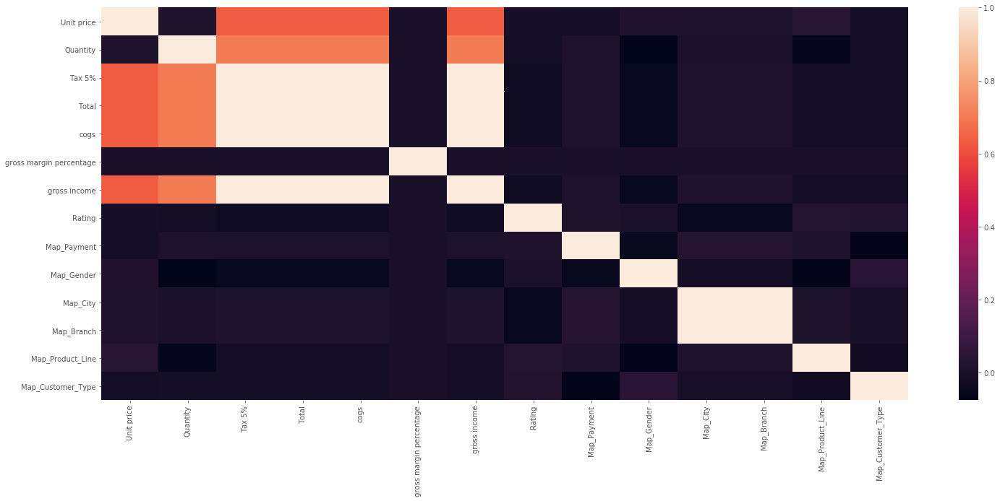

In [11]:
sns.heatmap(sales.corr() )

### Todo: Draw Linear Regression Relationship 
* Rating vs Unit Price 
* Rating vs Quantity
* Rating vs Tax 5%
* Rating vs Total
* Rating vs cogs ( Cost of Golds) 


# Time Series: Predicting Number of Items sold 

/opt/conda/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:80: UserWarning: Attempting to set identical left == right == 4.7619047619999995 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/opt/conda/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:81: UserWarning: Attempting to set identical bottom == top == 4.7619047619999995 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/opt/conda/lib/python3.7/site-packages/pandas/plotting/_matplotlib/misc.py:71: UserWarning: Attempting to set identical left == right == 4.7619047619999995 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8a9c0bbd10>,
      dtype=object)

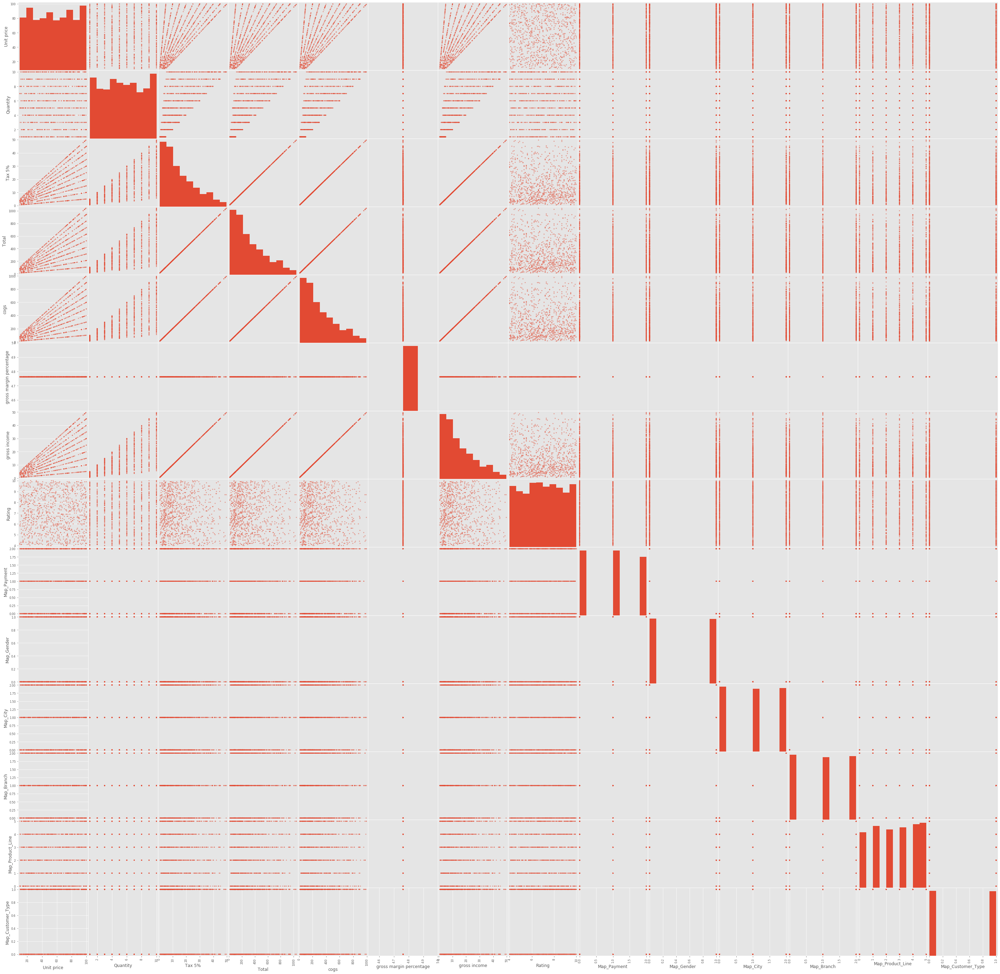

In [12]:
pd.plotting.scatter_matrix(sales[col_names[6:10] + col_names[11:] ],figsize=(50,50))


In [13]:
map_gender = pd.factorize(sales.Gender)
gender: Dict = get_col_desc( col_one=sorted(set(map_gender[0])), col_two=map_gender[-1].tolist() )

map_city = pd.factorize(sales.City)
city: Dict = get_col_desc(sorted(set(map_city[0].tolist())) , map_city[-1].tolist()  )

## Data Explorations
### Sales by branch
- **Data Description**:
- Branch A = 0 ; B = 2 , C = 1 
- Gender: 
    - F = 0 
    - M = 1
    
- City
    - Yangon = 0
    - Naypyitaw = 1
    - Mandalay = 2
    
- h.	What is the busiest time of the day?

- i.	What is the average amount customer spend in a single transaction? 


- j.	How much sales does the store generate from member and non- member?

- k.	What is the average profit for each branch in a month?

- l. Which branch has more customers but lower profit?

- m. Product lines sales for each month?

### The avearge amount spend in a single transaction 

In [14]:
sales['Total'].mean() 

322.96674900000005

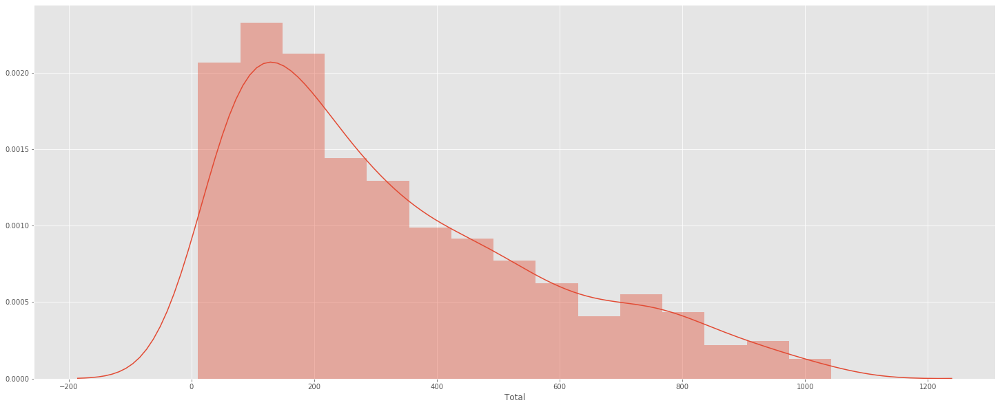

In [15]:
sns.distplot(sales['Total'])

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(0.5, 6.79999999999999, "Gender: ['Female', 'Male'] =[0, 1]")

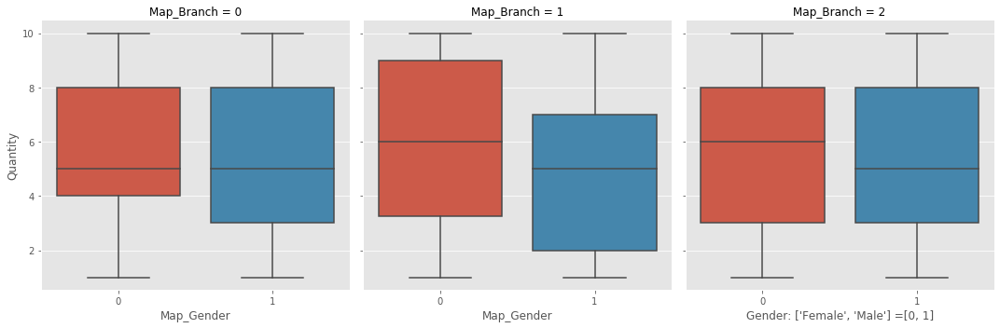

In [16]:
# Do men buy more items than women ?
# Branch A, 
sns.factorplot(col='Map_Branch', x='Map_Gender', y='Quantity', data=sales, kind='box') 
plt.xlabel(f"Gender: {list(gender.keys())} ={list(gender.values())}")

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


Text(0.5, 6.79999999999999, "Gender: ['Female', 'Male'] =[0, 1]")

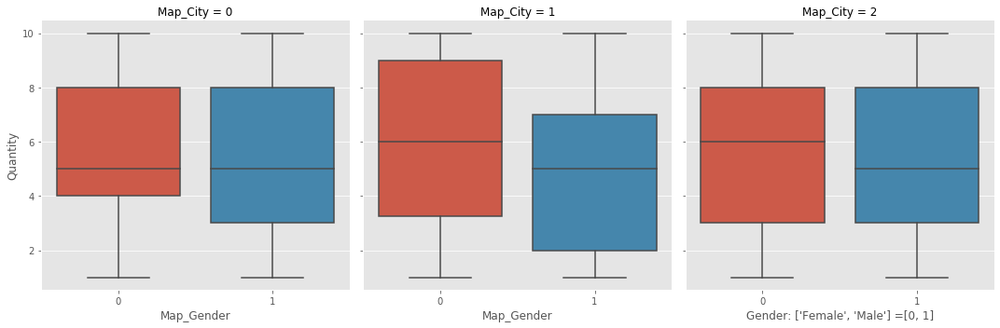

In [17]:
# Sold items by city 
sns.factorplot(col='Map_City', x='Map_Gender', y='Quantity', data=sales, kind='box') 
plt.xlabel(f"Gender: {list(gender.keys())} ={list(gender.values())}")

In [18]:
sales.groupby('Branch')['Total'].agg(['max','count'])

,max,count
Branch,,
A,1039.29,340
B,1022.49,332
C,1042.65,328


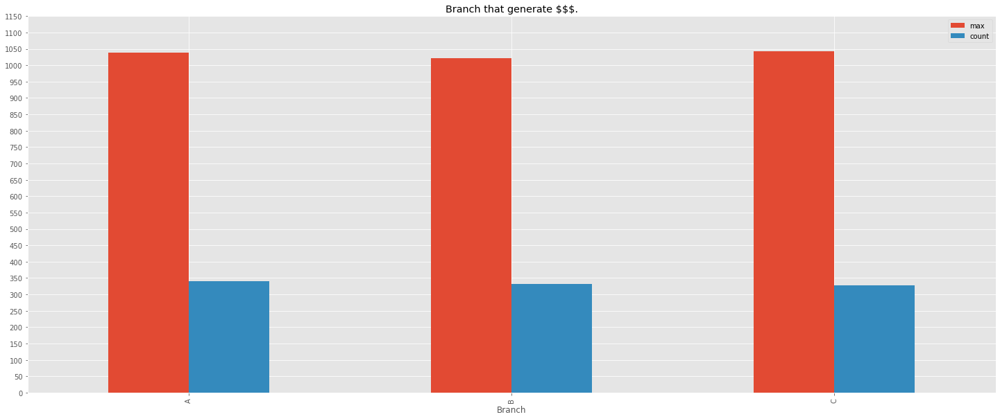

In [19]:
# Which branch genereate more $$$ 
sales.groupby('Branch')['Total'].agg(['max','count']).plot(kind='bar')
plt.yticks(range(0,1200,50))
plt.title("Branch that generate $$$.")
plt.grid(True)

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


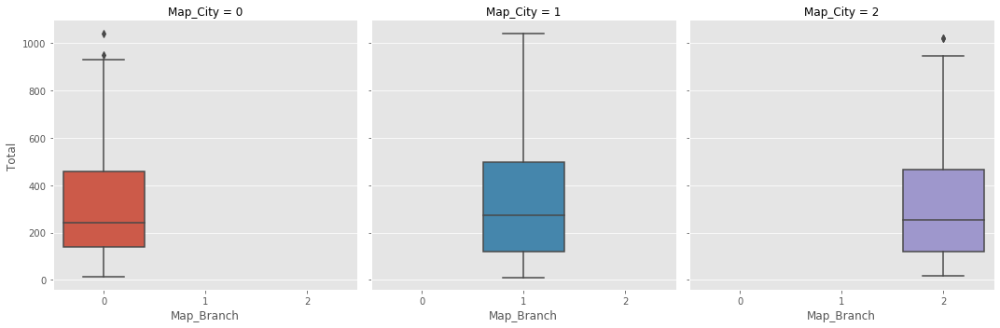

In [20]:
# Which Branch city generate $$$ ? 
# {'Yangon': 0, 'Naypyitaw': 1, 'Mandalay': 2}, City = Naypitaw , Branch = C == $$$
sns.factorplot(col='Map_City', x='Map_Branch', y='Total', data=sales, kind='box')

In [21]:
sales.groupby('City')['gross income'].agg(['max', 'min', 'mean','median'])

,max,min,mean,median
City,,,,
Mandalay,48.69,0.8875,15.232024,12.04200
Naypyitaw,49.65,0.5085,16.052367,12.92475
Yangon,49.49,0.6045,14.874001,11.46800


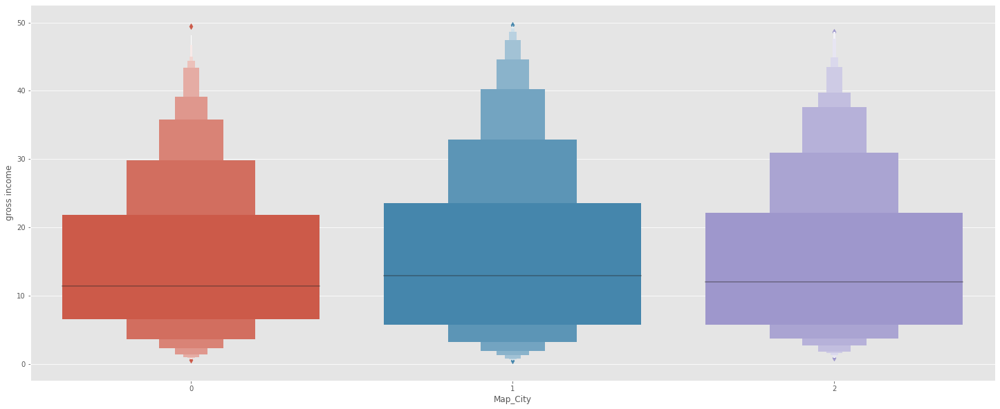

In [22]:
# Are the buyers Poor or Rich by city,
sns.boxenplot(x='Map_City', y='gross income', data=sales)

Text(0.5, 1.0, 'Customer Service Distributions')

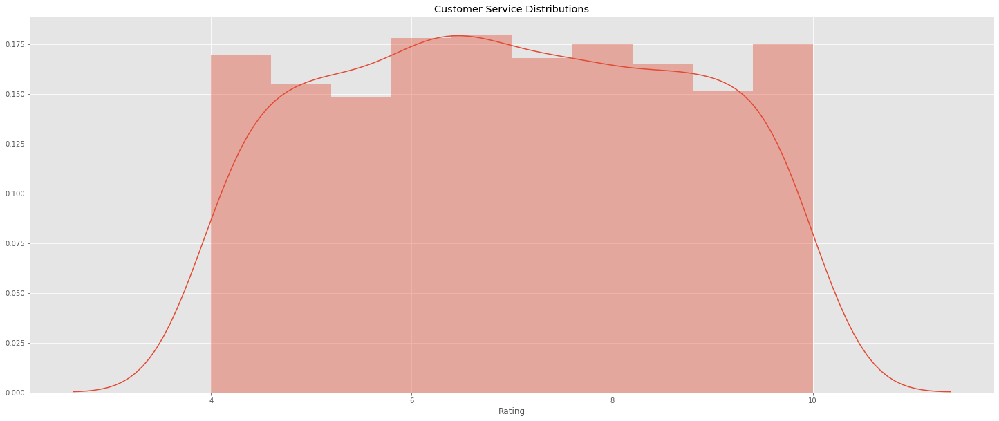

In [23]:
# Are the clients satisfied with the services ? 6.972
sns.distplot(sales.Rating)
plt.title("Customer Service Distributions")

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


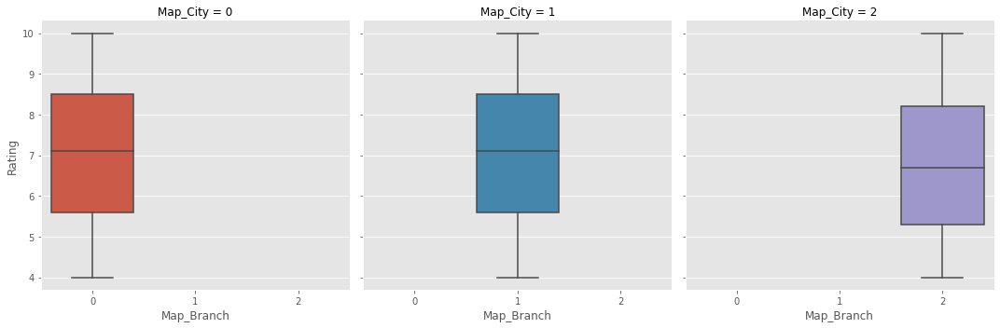

In [24]:

# Store rating based on customer service
sns.factorplot(col='Map_City', x='Map_Branch', y='Rating', data=sales, kind='box')
# Payment methods 

### Populat Item in January 

Text(0.5, 1.0, 'Popular items sold in January 2019.')

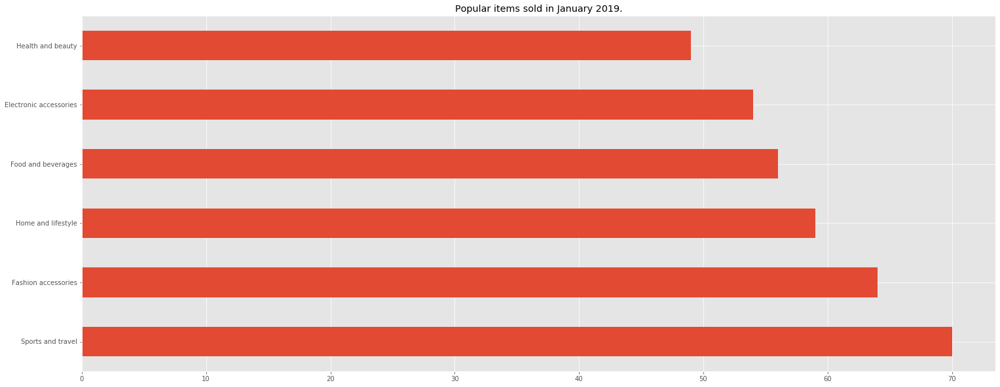

In [25]:
sales['2019-01']['Product line'].value_counts().plot(kind='barh')
plt.title("Popular items sold in January 2019.")

Text(0.5, 1.0, 'Popular items sold in February 2019.')

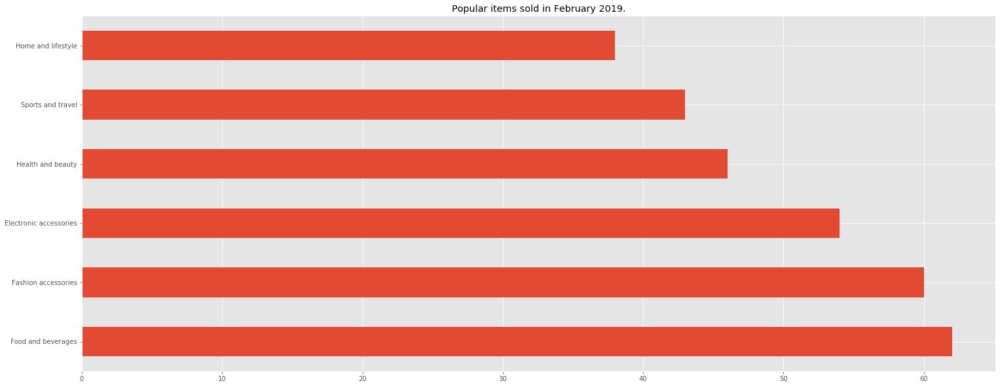

In [26]:
sales['2019-02']['Product line'].value_counts().plot(kind='barh')
plt.title("Popular items sold in February 2019.")

Text(0.5, 1.0, 'Popular items sold in March 2019.')

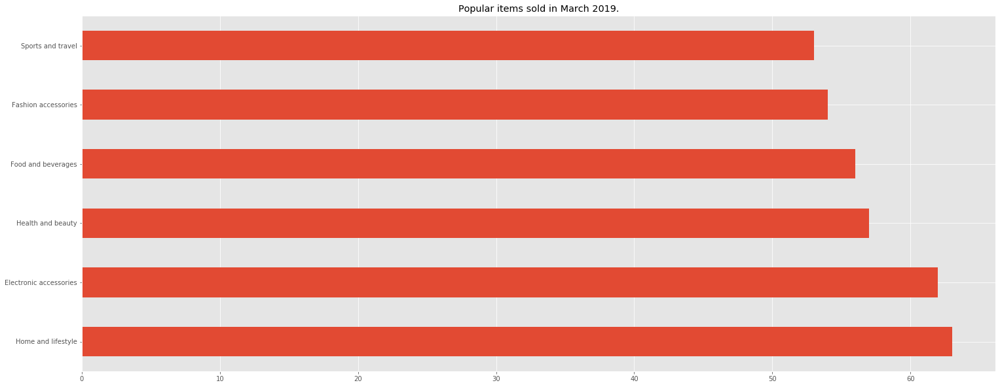

In [27]:
sales['2019-03']['Product line'].value_counts().plot(kind='barh')
plt.title("Popular items sold in March 2019.")

### Sales By date

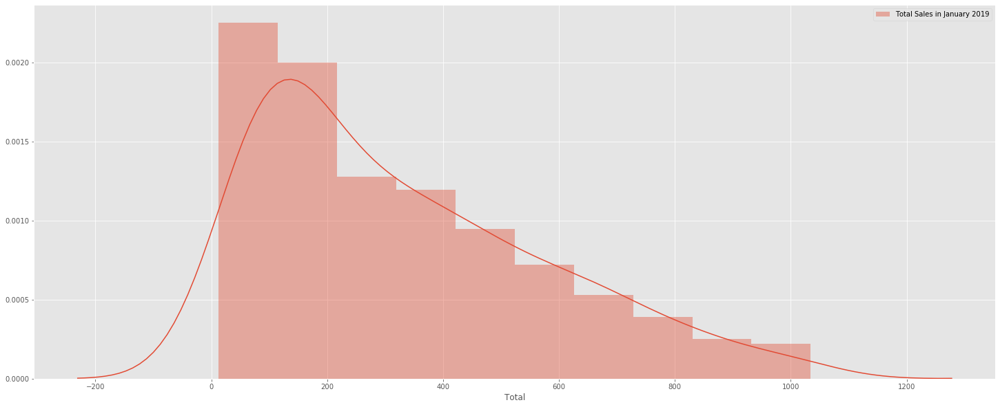

In [28]:
sns.distplot(sales['2019-01'].Total,norm_hist=True,label="Total Sales in January 2019")
plt.legend() 

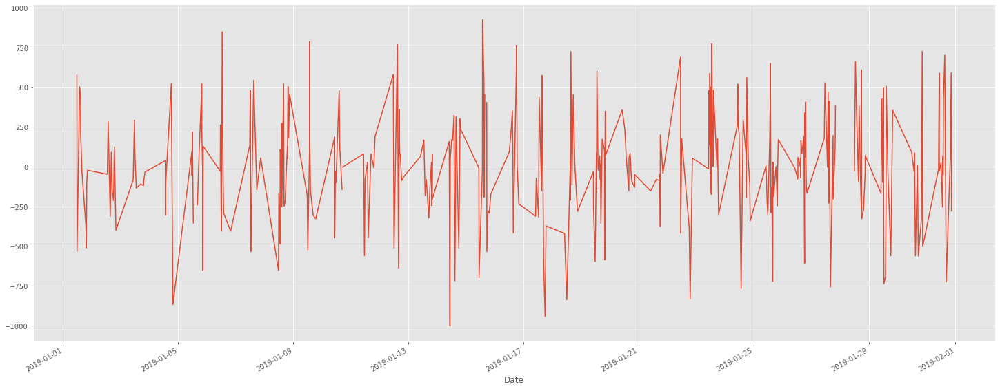

In [29]:
# Diff 
sales['2019-01'].Total.diff(periods=5).plot() 

## Rolling Averages
### Sales Trends by Month: January 2019

Text(0.5, 1.0, 'Sales Trend in Month of January 2019')

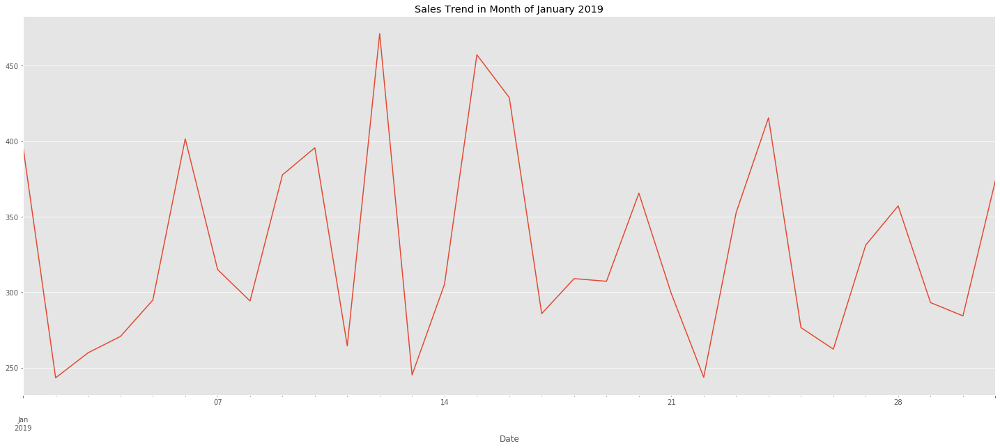

In [30]:
# Graph the sales in January, do people spend more money on new year ? 
# In January there is a spike on the 12th and drop on the 13th

sales.Total['2019-01'].resample('D').mean().plot() 
plt.title("Sales Trend in Month of January 2019")

### Sales Trend in February 

Text(0.5, 0, 'By Dates')

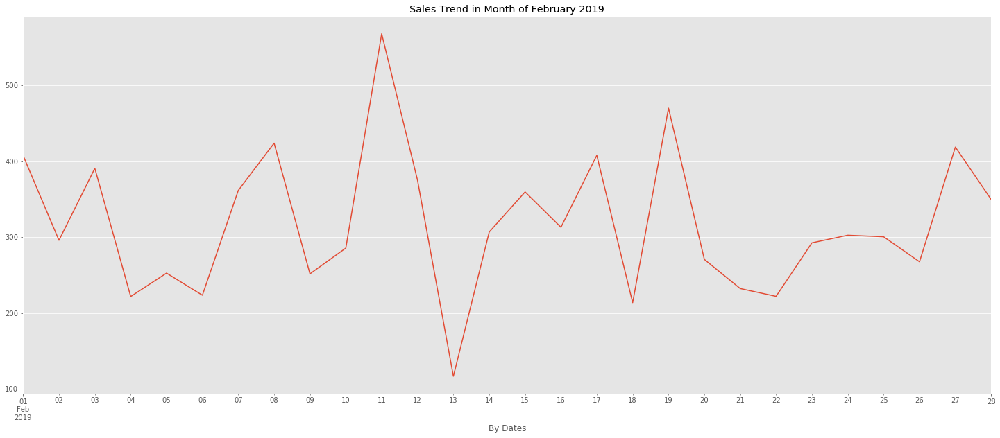

In [31]:
# Note: Sales spikes on the 11 February 2019 and drop on 13 February 2019 
sales.Total['2019-02'].resample('D').mean().plot() 
plt.title("Sales Trend in Month of February 2019")
plt.xlabel("By Dates")

### Sales Trend in March 

(737126.4372800926, 737127.7107754629)

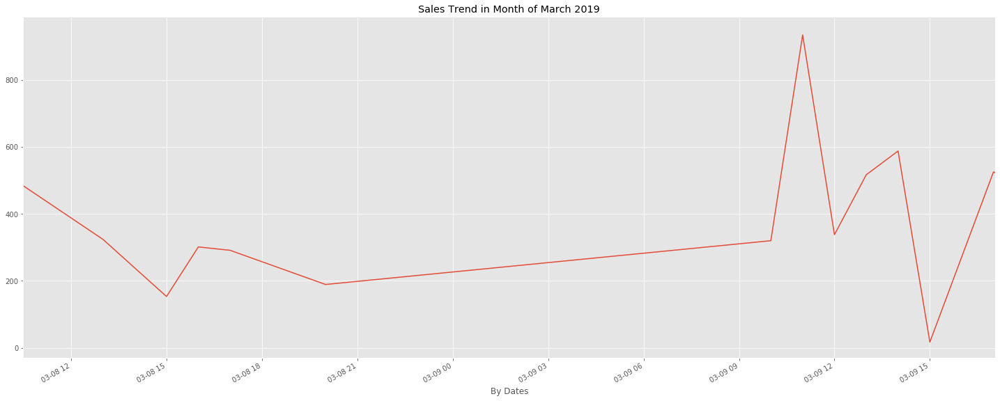

In [32]:
# Note: Sales spikes on the 29 March 2019 and drop on 07 and 26 February 2019 
sales.Total['2019-03'].resample('1H').mean().dropna().plot() 
plt.title("Sales Trend in Month of March 2019")
plt.xlabel("By Dates")
plt.xlim([sales['2019-03'].index[0], sales['2019-03'].index[3]])

Text(0.5, 0, 'Hourly Sales')

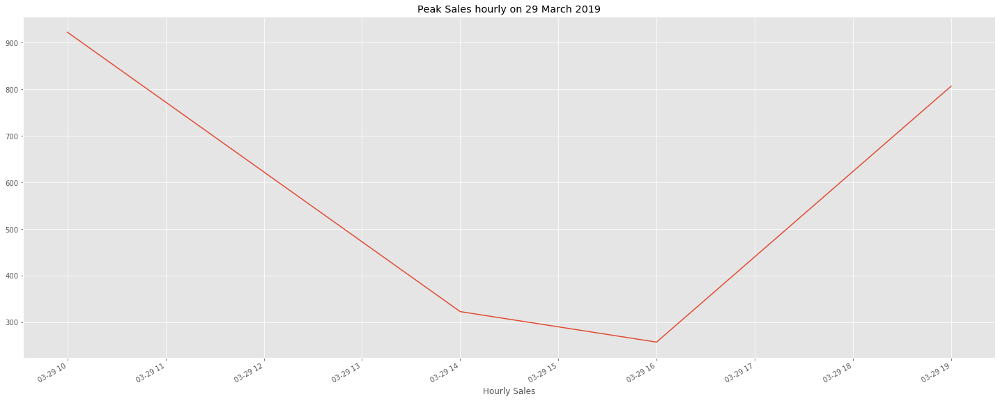

In [33]:
sales.Total['2019-03-29'].resample('60T').mean().dropna().plot()
plt.title("Peak Sales hourly on 29 March 2019")
plt.xlabel("Hourly Sales")

Text(0.5, 1.0, 'Rolling Averages: Sales Trends from January - March 2019')

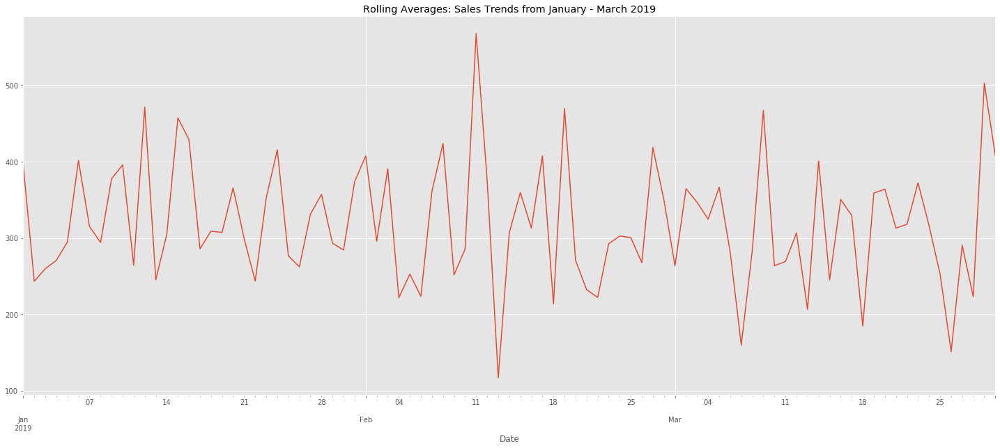

In [34]:
# Resample by Day
sales.Total.resample('D').mean().plot() 
plt.title('Rolling Averages: Sales Trends from January - March 2019')

Text(0.5, 1.0, 'Sales Total with Rolling window = 20 ')

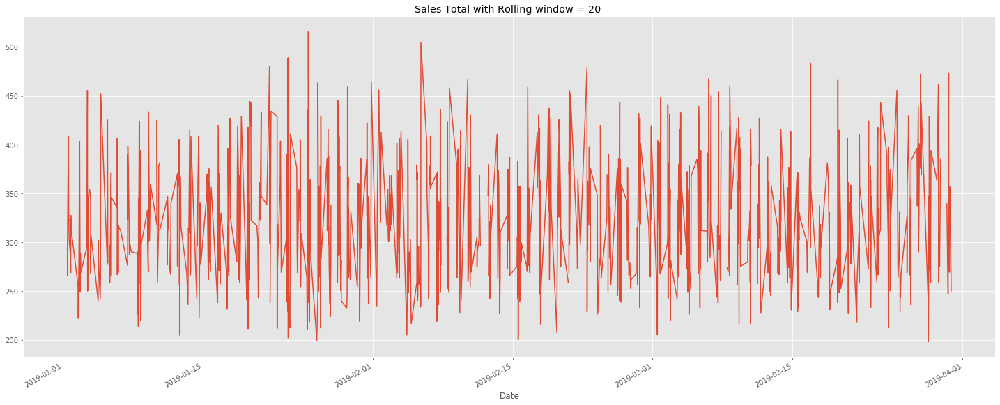

In [35]:
# Graph Total Rolling Window
sales['Total'].rolling(window=20).mean().plot() 
plt.title("Sales Total with Rolling window = 20 ")

### Total Price Autocorelation 

In [36]:
# Lags from 0 to 1000 
autocorr_socres: List[float] = [ sales['Total'].autocorr(lag=lag) for lag in range(1001)] 

/opt/conda/lib/python3.7/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/opt/conda/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


([<matplotlib.axis.XTick at 0x7f8a89ce31d0>,
 <a list of 11 Text xticklabel objects>)

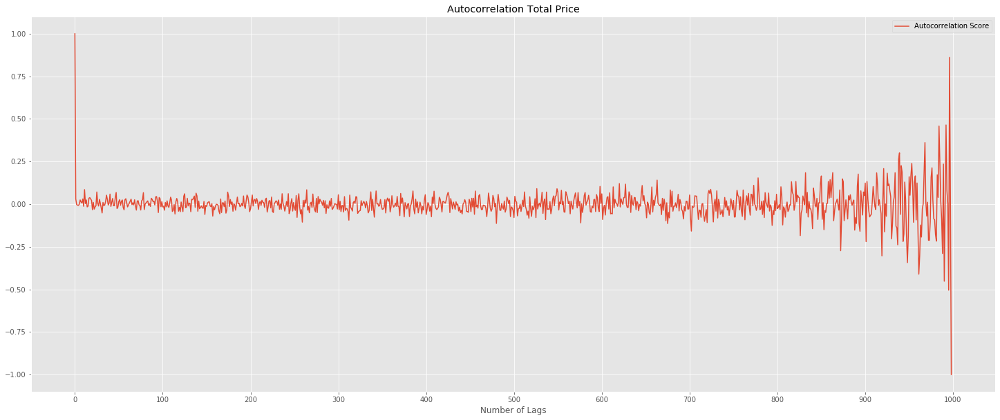

In [37]:
pd.DataFrame(np.array(autocorr_socres) , index=range(0,1001), columns=['Autocorrelation Score']).plot() 
plt.title("Autocorrelation Total Price")
plt.xlabel("Number of Lags")
plt.xticks(range(0,1100,100))

(-0.1, 0.1)

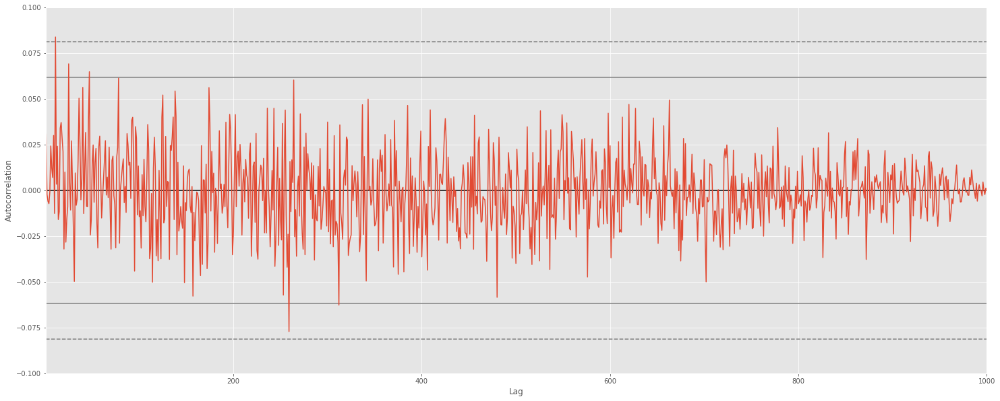

In [38]:
# Note: it hould decrease to zero as lag increases 
autocorrelation_plot(sales.Total)
plt.grid(True)
plt.ylim([-0.1, 0.1])


### Quantity Autocorrelation

In [39]:
sales['Quantity'].autocorr(lag=500)

-0.03445159360891986

(-0.1, 0.1)

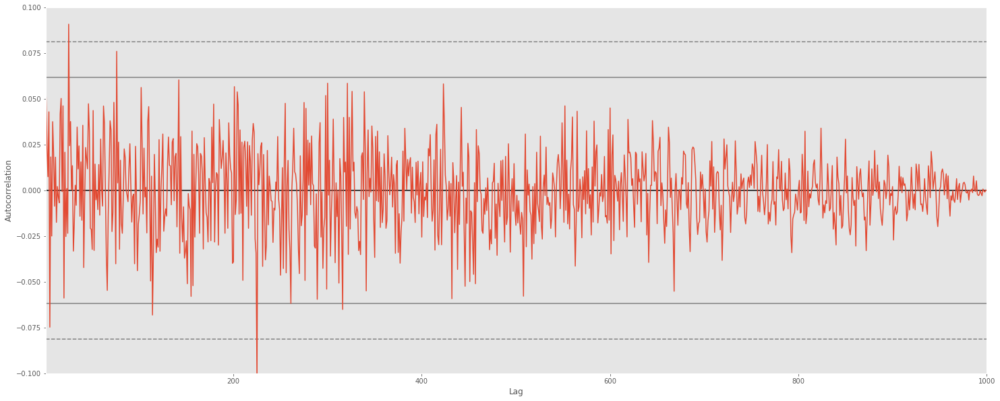

In [40]:
autocorrelation_plot(sales.Quantity)
#plt.yticks(range(-0.1, 0.1, 0.05))
plt.ylim([-0.1, 0.1])

### Total Autocorellation with 10 Lags

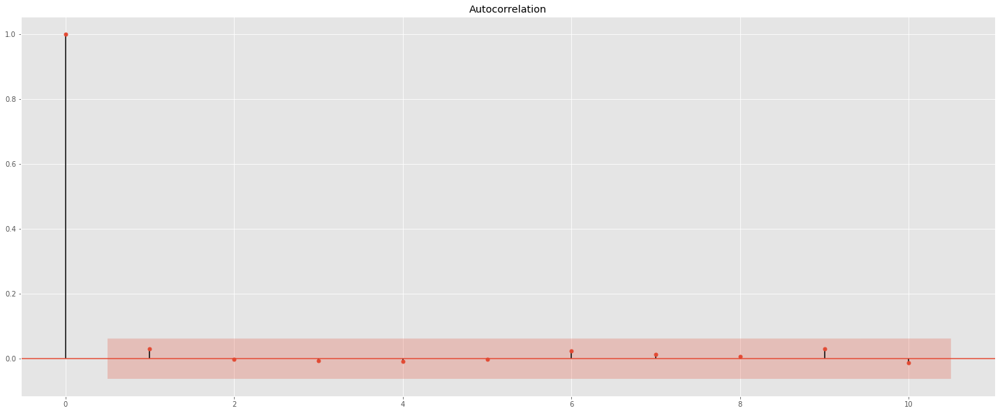

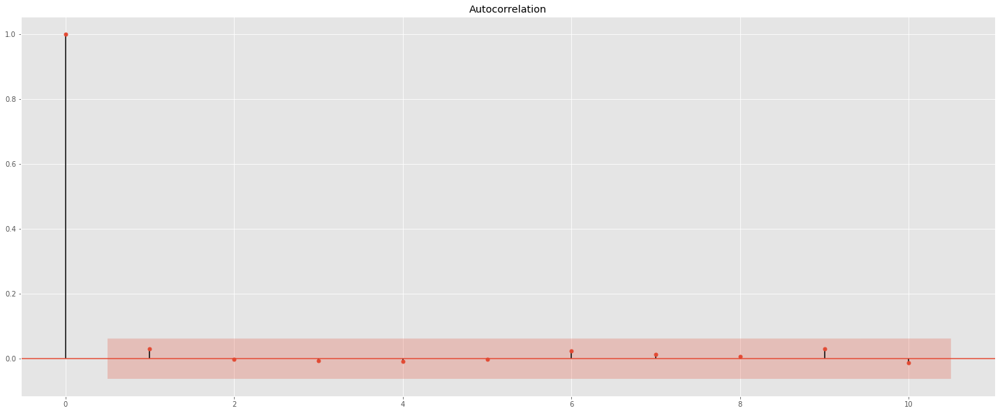

In [41]:
# Drop when lag = 5 
plot_acf(sales.Total, lags=10)

Quantity Autocorellation with lag=30 ( 1 Month)

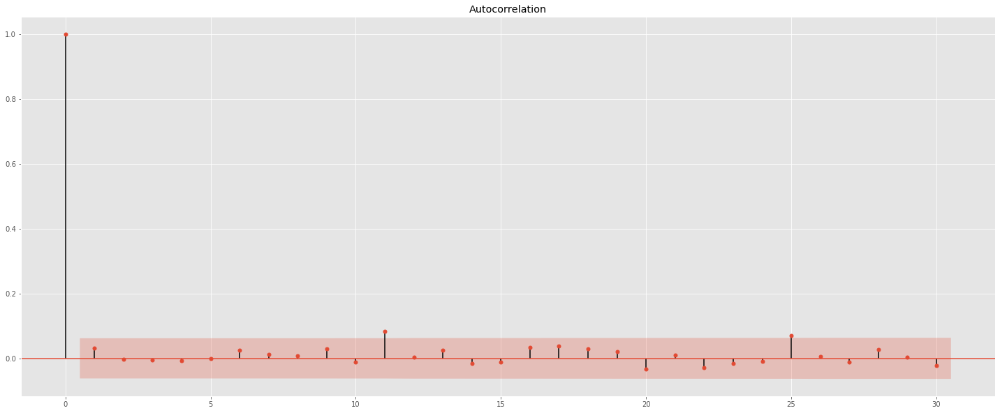

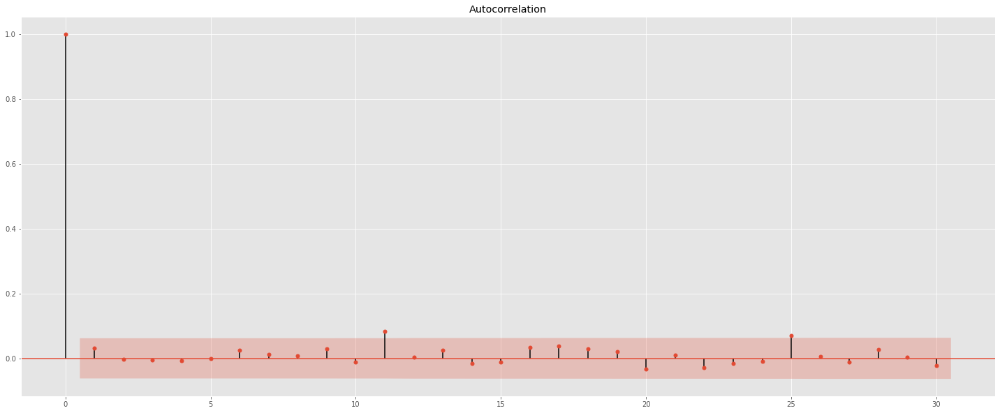

In [42]:
# Little spike at lags = 11 and 25
plot_acf(sales.Total, lags=30)

### Quantity: ARMA Model
### Column Desc: Quantity = Number of products purchased by customer
#### Intercept: 5.51 + previous months sales * 0.0510

In [43]:
sales['Total'].diff(1).autocorr(lag=1) # Lag=1 
# ARMA coeff : 0.0308

-0.4822967299083367

### AR(1) , MA(0) 

In [44]:
model_arma = ARMA(sales.Total, (1,0)).fit() 
model_arma.summary() 

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:222: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  ' forecasting.', ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Total   No. Observations:                 1000
Model:                     ARMA(1, 0)   Log Likelihood               -6922.830
Method:                       css-mle   S.D. of innovations            245.646
Date:                Sat, 16 May 2020   AIC                          13851.660
Time:                        06:22:27   BIC                          13866.384
Sample:                             0   HQIC                         13857.256
                                                                              
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const         322.9841      8.015     40.300      0.000     307.276     338.692
ar.L1.Total     0.0308      0.032      0.973      0.330      -0.031       0.093
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           32.4813           +0.0000j           32.4813            0.0000
-----------------------------------------------------------------------------
"""

### Model Residual 

Text(0.5, 1.0, 'Residual in January 2019')

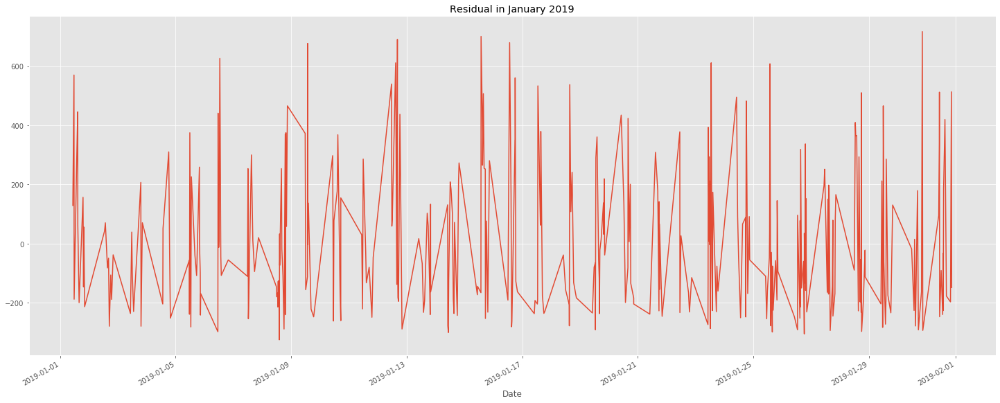

In [45]:
model_arma.resid['2019-01'].plot() 
plt.title("Residual in January 2019")

Text(0.5, 1.0, 'ARMA Model Residuals')

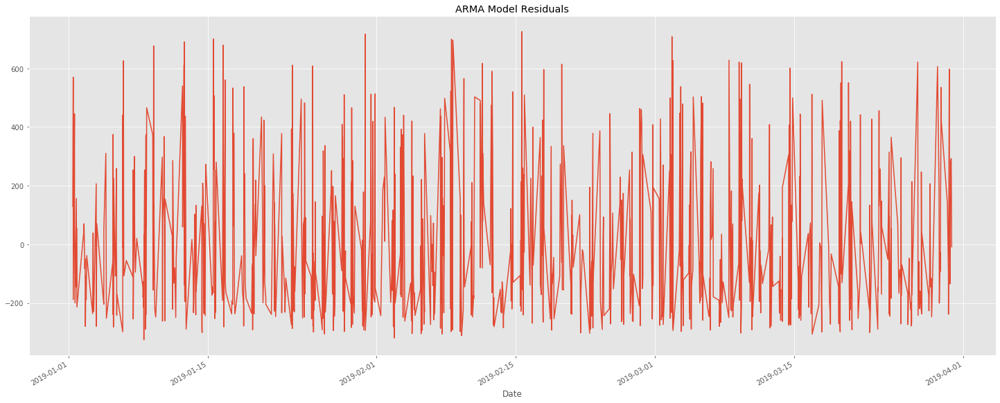

In [46]:
model_arma.resid.plot() 
plt.title("ARMA Model Residuals")
# Sales are equaly distributed from January 2019 to April 2019 

Text(0.5, 1.0, 'ARMA Model Residual Autocorrelation')

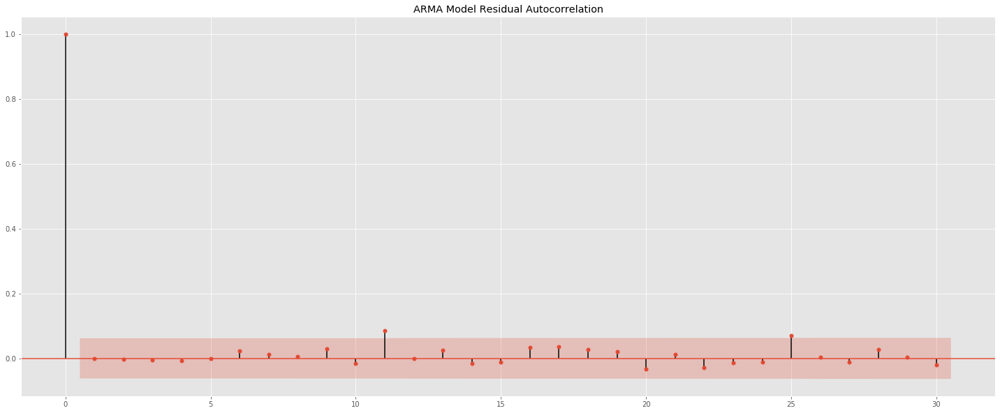

In [47]:
# Residual 
plot_acf(model_arma.resid, lags=30)
plt.title('ARMA Model Residual Autocorrelation')

### Graph Predict Total Sales 100 days out

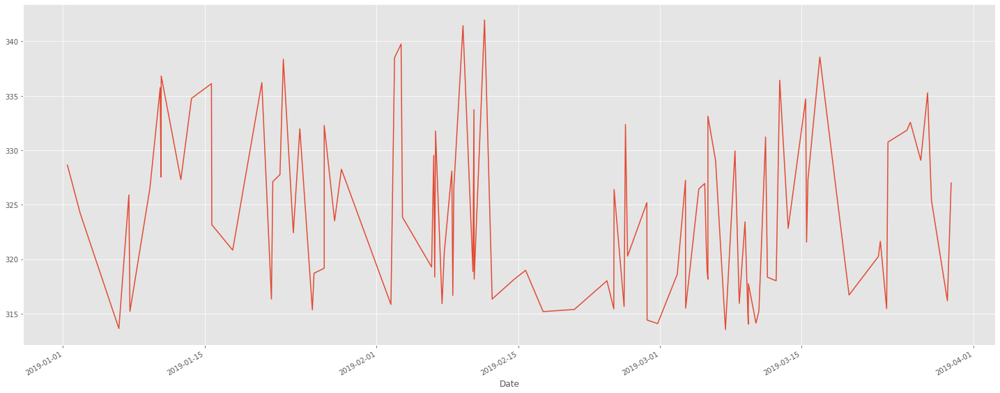

In [48]:
model_arma.predict(1,100).plot() 

### Forecast Sales in March 2019

(737119.4323611112, 737148.8594907407)

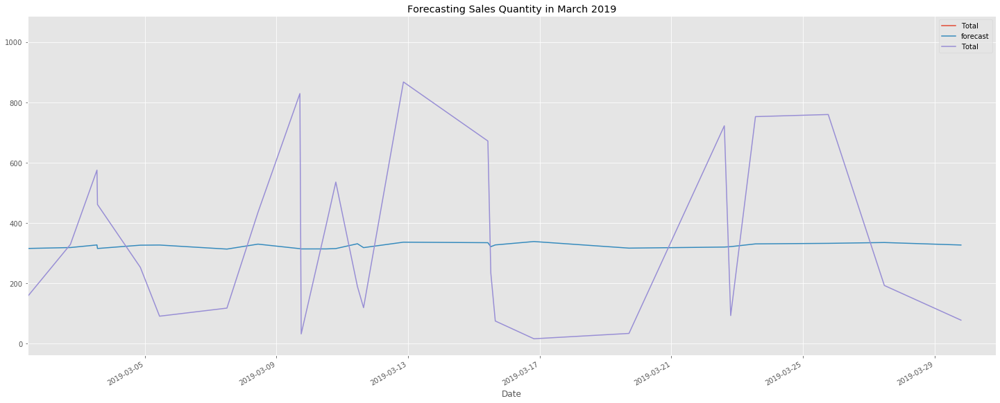

In [49]:
fig, ax = plt.subplots() 
ax = sales['2019-01']['Total'].plot(ax=ax)
model_arma.plot_predict(1,60, ax=ax)
plt.title("Forecasting Sales Quantity in March 2019")
plt.xlim([min( sales['2019-03'].index.tolist() ), max( sales['2019-03'].index.tolist() )])

In [50]:
# model_arma = ARMA(sales.Quantity, (2,0)).fit() 
# model_arma.summary() 

# K-Means 
### Descriptions: Clusters based on 
- Locations 
- Branch 
- Customer Types 
- Genders 
- Incomes
- Rating
- Products sold 
- Price

In [51]:
# Clusters sales based on the following columns
col_names: List[str] = sales.columns.tolist()
sales[[col_names[7], col_names[9]]] = sales[[col_names[7], col_names[9]]].astype(float)
clusters: List[str] = [col_names[7], col_names[9]] + col_names[13:]

### Relationships Graphs 

In [52]:
pd.plotting.scatter_matrix( sales[clusters] , figsize=(150,150))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8a89451a50>,
      dtype=object)

In [53]:
km_sales = KMeans(n_clusters=np.random.randint(5,10), random_state=np.random.randint(100,150))
km_sales.fit(sales[clusters])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=115, tol=0.0001, verbose=0)

In [54]:
# Number of cluster equals random number from 5 - 10  
sales['sales_cluster'] = km_sales.labels_

In [55]:
# Sillhouete scores 
silhouette_score(sales[clusters], km_sales.labels_ )

0.5192125972228872

In [56]:
cluster_colors: List[str] = np.array( ['red', 'blue', 'gold', 'darkviolet', 'lime', 'yellow', 'green', 'blueviolet', 'lime', 'tomato', 'orangered','aqua','cyan', 'turquoise','steelblue'] )

In [57]:
sales.groupby('sales_cluster').mean() 

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Map_Payment,Map_Gender,Map_City,Map_Branch,Map_Product_Line,Map_Customer_Type
sales_cluster,,,,,,,,,,,,,,
0,34.066446,2.090361,2.628250,55.193250,52.565000,4.761905,2.628250,6.775301,0.993976,0.506024,0.981928,0.981928,2.656627,0.481928
1,84.145616,8.767123,36.440945,765.259849,728.818904,4.761905,36.440945,6.697260,0.972603,0.424658,1.041096,1.041096,2.438356,0.493151
2,57.773609,5.511278,13.801508,289.831658,276.030150,4.761905,13.801508,6.981203,0.954887,0.533835,0.902256,0.902256,2.511278,0.413534
3,69.132551,7.244898,23.821230,500.245821,476.424592,4.761905,23.821230,7.183673,0.826531,0.500000,0.897959,0.897959,2.602041,0.489796
4,46.518889,5.246914,9.387710,197.141907,187.754198,4.761905,9.387710,7.215432,0.956790,0.487654,0.870370,0.870370,2.672840,0.555556
5,92.128718,9.666667,44.452436,933.501154,889.048718,4.761905,44.452436,6.892308,1.076923,0.487179,1.051282,1.051282,2.717949,0.461538
6,60.986038,6.669811,18.601571,390.632986,372.031415,4.761905,18.601571,6.982075,0.952830,0.433962,1.150943,1.150943,2.660377,0.537736
7,77.665672,7.895522,29.742791,624.598612,594.855821,4.761905,29.742791,6.555224,1.074627,0.507463,1.014925,1.014925,2.343284,0.477612
8,42.425577,3.955128,5.729628,120.322192,114.592564,4.761905,5.729628,7.112821,0.974359,0.551282,1.108974,1.108974,2.487179,0.532051


## Relationship: Gross Income vs Store Locations 

Text(0, 0.5, 'Gross Income')

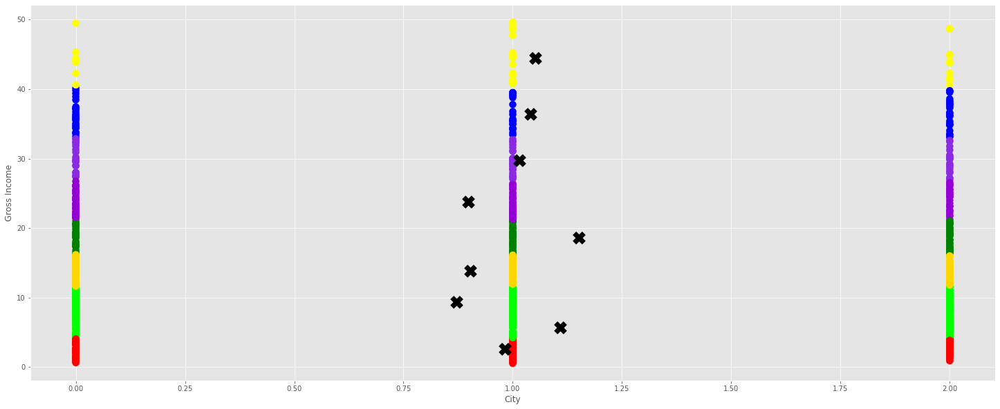

In [58]:
cluster_centers = sales.groupby('sales_cluster').mean() 
plt.scatter(sales['Map_City'], sales['gross income'], c=cluster_colors[sales['sales_cluster']], s=100 )
plt.scatter(cluster_centers['Map_City'], cluster_centers['gross income'], linewidths=1, marker="X",  c='black',s=300 )
plt.xlabel("City")
plt.ylabel("Gross Income")

## Relationship: Total Sales vs Rating

In [59]:
table_colors = pd.DataFrame.from_dict( cluster_colors )
table_colors.columns = ['Table Colors']
table_colors 

,Table Colors
0,red
1,blue
2,gold
3,darkviolet
4,lime
5,yellow
6,green
7,blueviolet
8,lime
9,tomato


Text(0, 0.5, 'Total')

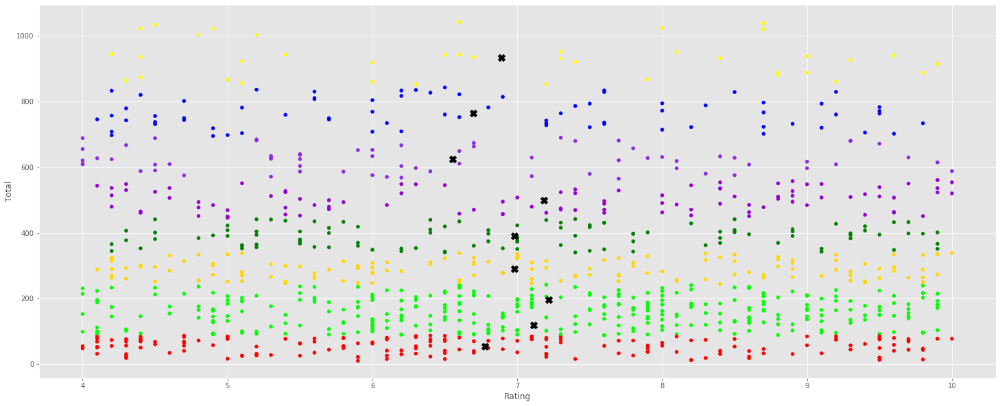

In [60]:
cluster_centers = sales.groupby('sales_cluster').mean() 
plt.scatter(sales['Rating'], sales['Total'], c=cluster_colors[sales['sales_cluster']], s=25 )
plt.scatter(cluster_centers['Rating'], cluster_centers['Total'], linewidths=1, marker="X",  c='black',s=100 )
plt.xlabel("Rating")
plt.ylabel("Total")

### Rating vs Gross Income 

In [61]:
sales['Total'].max() 

1042.65

Text(0, 0.5, 'Rating')

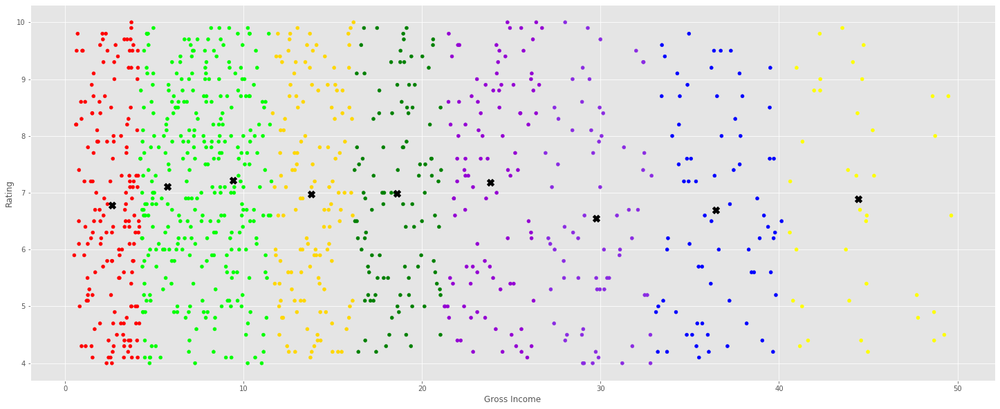

In [62]:
plt.scatter(sales['gross income'], sales['Rating'], c=cluster_colors[sales['sales_cluster']], s=25 )
plt.scatter(cluster_centers['gross income'], cluster_centers['Rating'], linewidths=1, marker="X",  c='black',s=100 )
plt.xlabel("Gross Income")
plt.ylabel("Rating")

### Scatter Matrix Clusters

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8a84d185d0>,
      dtype=object)

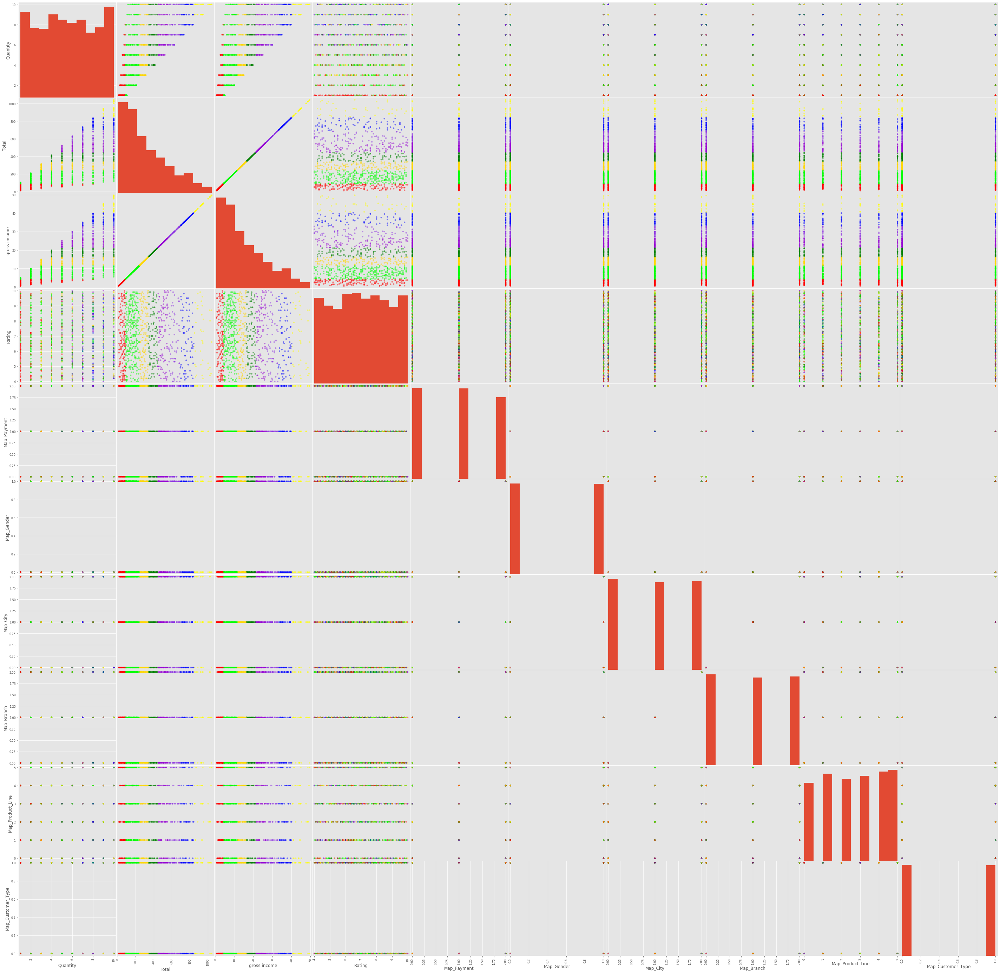

In [63]:
pd.plotting.scatter_matrix(sales[clusters], c=cluster_colors[sales['sales_cluster']], figsize=(50,50), s=75)

### The best n_cluster based on Sillhoute scores

In [64]:
cluster_ranges = range(5,100)
inertias: List[float] = []
silhouette_scores: List[float] = [] 
for n_cluster in cluster_ranges:
    kmeans = KMeans(n_clusters=n_cluster)
    kmeans.fit(sales[clusters])
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(sales[clusters], kmeans.labels_))

In [65]:
# Datframe Silhouette Scores and Inertias 
cluster_scores = pd.DataFrame(np.array([inertias, silhouette_scores]).transpose() , columns=['Inertias', 'Silhouete Scores'], index=range(5,100))

In [66]:
cluster_scores[ cluster_scores['Silhouete Scores'] == cluster_scores['Silhouete Scores'].max() ] # The best n_cluster = 7

,Inertias,Silhouete Scores
7,1.422358e+06,0.560717


### The best n_cluster based on Elbow Methods 

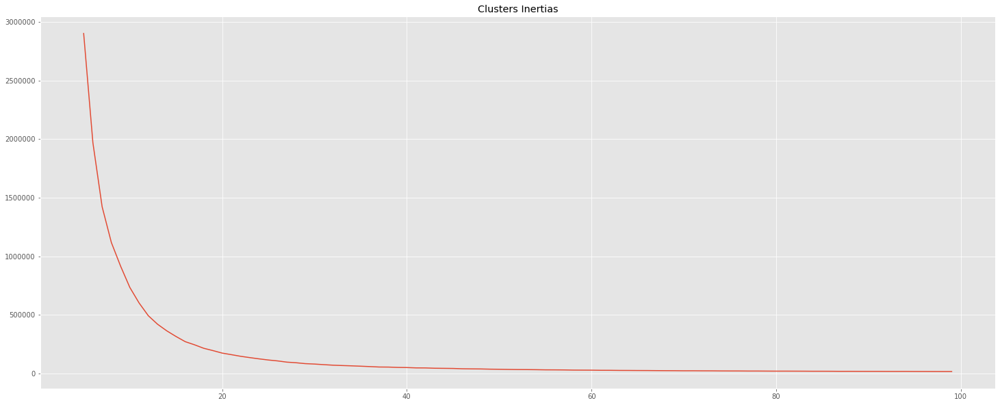

In [67]:
cluster_scores['Inertias'].plot() 
plt.title("Clusters Inertias")
plt.grid(True)

Text(0, 0.5, 'Silhouette Coefficients')

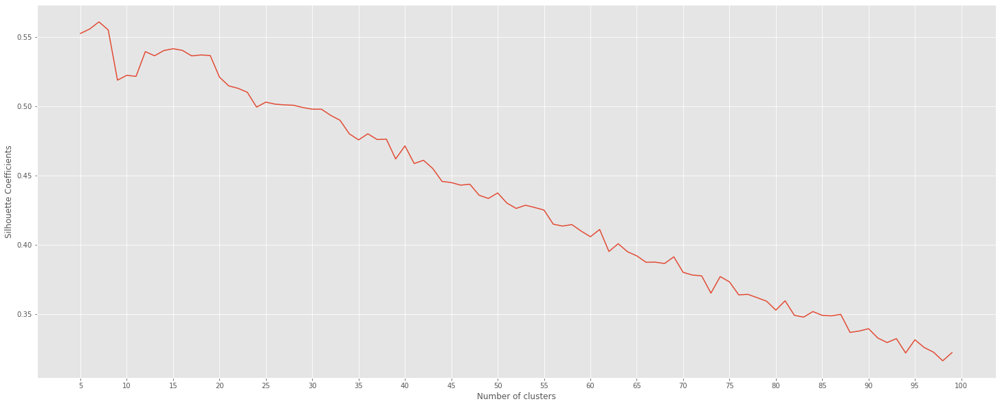

In [68]:
cluster_scores['Silhouete Scores'].plot() 
plt.xticks(range(5,101,5))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Coefficients")


### Scaled Models, Where n_cluster = 7

In [69]:
scaled_models: List[float] = [] 
for n_cluster in range(5,101):
    kmeans = KMeans(n_clusters=n_cluster, random_state=np.random.randint(100,150))
    kmeans.fit( StandardScaler().fit_transform(sales[clusters]) )
    scaled_models.append( silhouette_score(StandardScaler().fit_transform(sales[clusters]), kmeans.labels_) )

In [70]:
cluster_scores['scaled_silhouette'] = scaled_models[0:95]

([<matplotlib.axis.XTick at 0x7f8a7e79d5d0>,
 <a list of 20 Text xticklabel objects>)

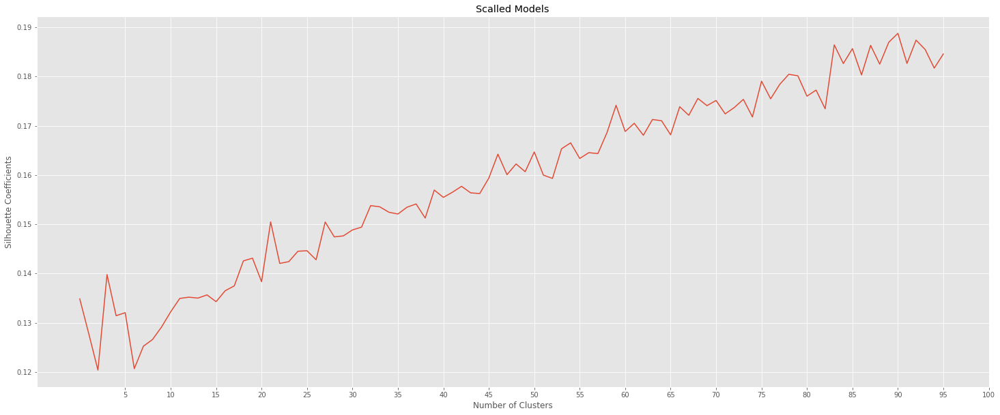

In [71]:
plt.plot(scaled_models)
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficients")
plt.title("Scalled Models")
plt.xticks(range(5,101,5))

In [72]:
cluster_scores[ cluster_scores['scaled_silhouette']  == cluster_scores['scaled_silhouette'].max() ]

,Inertias,Silhouete Scores,scaled_silhouette
95,16862.186233,0.331406,0.188761


### Scalled Model n_cluster=100 

In [73]:
kmeans = KMeans(n_clusters=99, random_state=123)
kmeans.fit(StandardScaler().fit_transform(sales[clusters]))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=99, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=123, tol=0.0001, verbose=0)

# LINEAR REGRESION 

#### Research Questions:
- h.	What is the busiest time of the day?
- i.	What is the average amount customer spend in a single transaction? 
- j.	How much sales does the store generate from member and non- member?
- k.	What is the average profit for each branch in a month?
- l. Which branch has more customers but lower profit?
- m. Product lines sales for each month?

### Busiest Time of Day 
Answer: The busies days are the following

### Dates where stores generates more sales

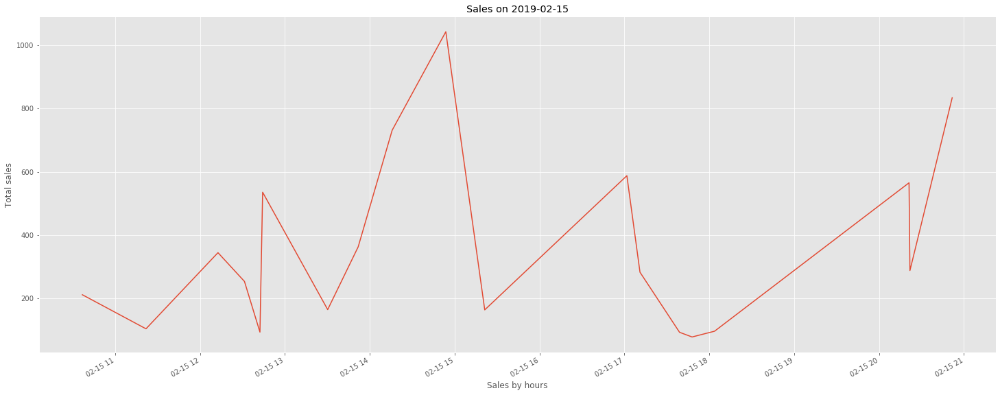

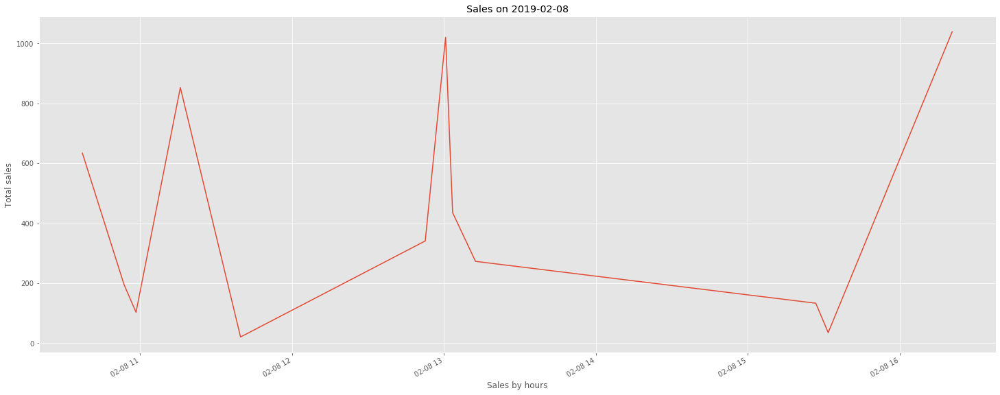

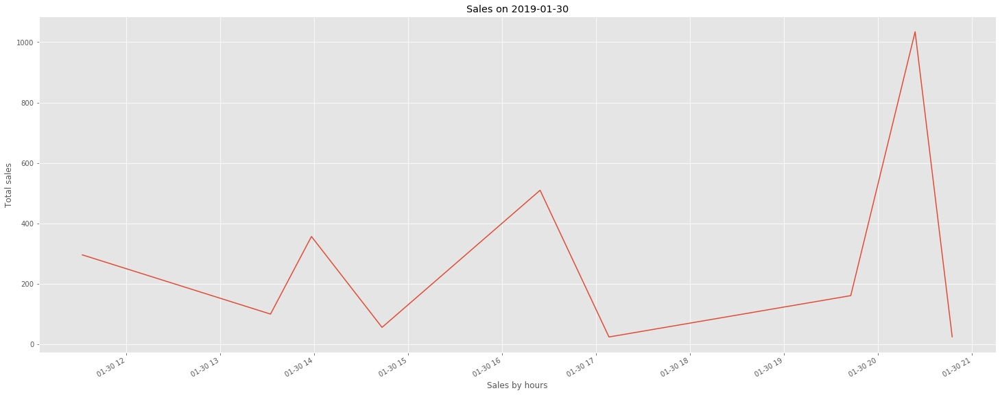

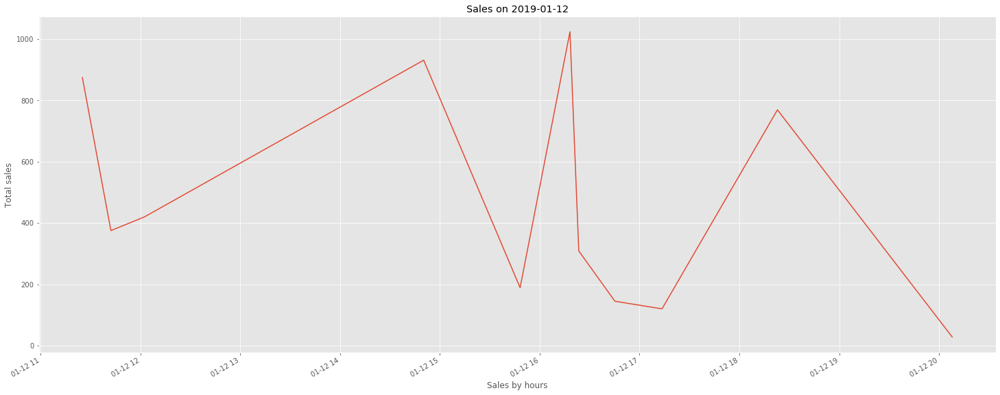

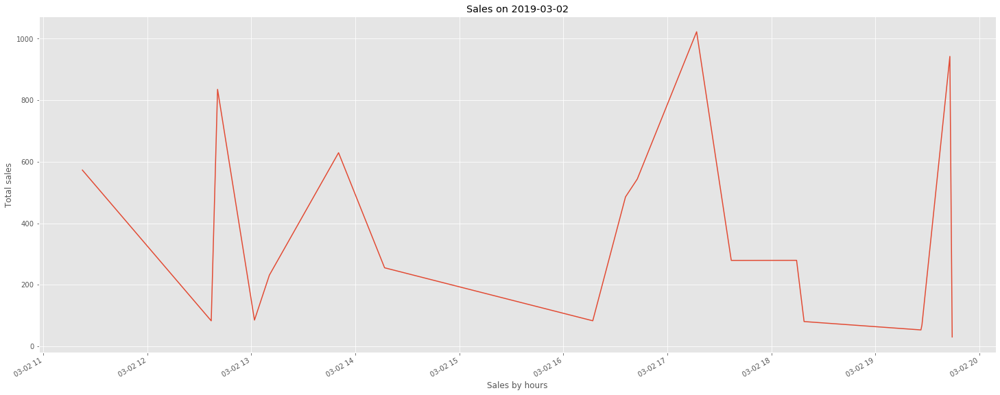

...

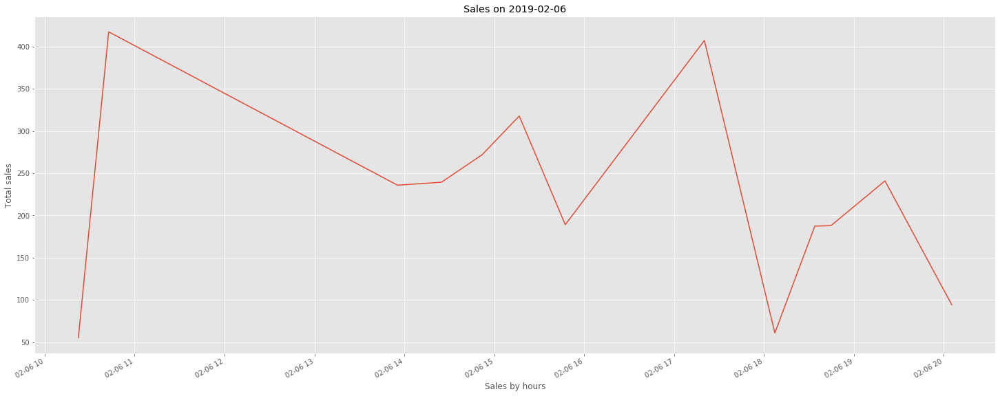

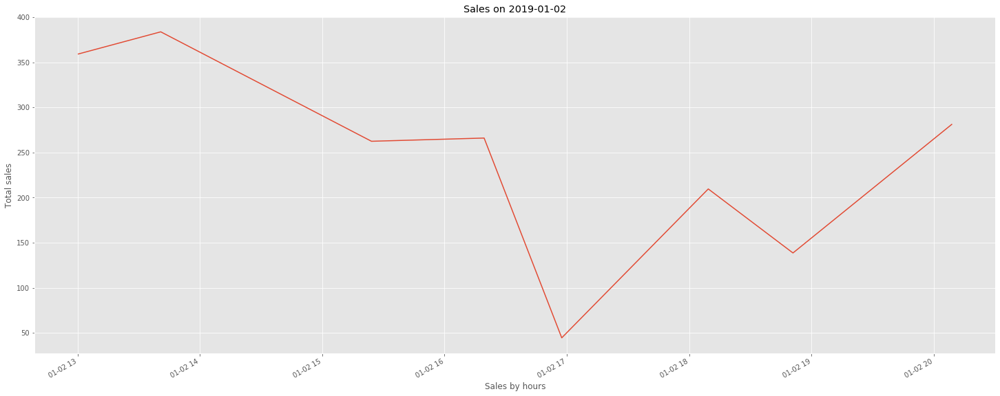

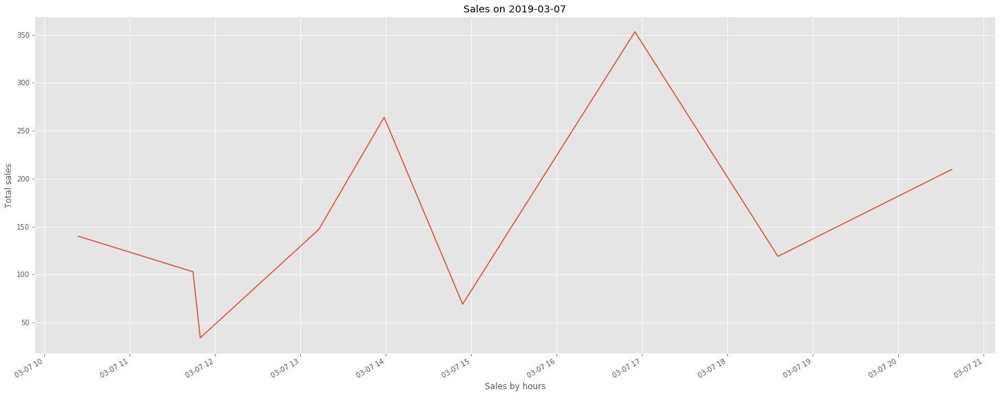

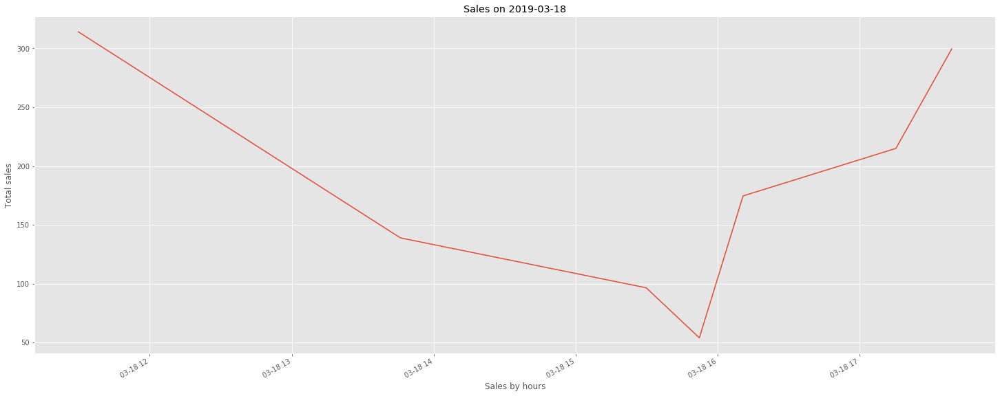

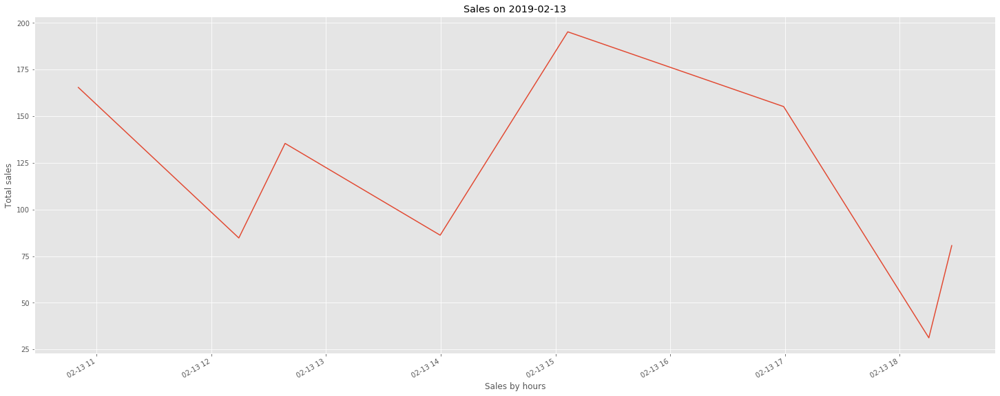

In [74]:
# fig, ax = plt.subplots(1, len(business_dates), sharey=True)
business_dates: List[Timestamp] = pd.DataFrame(sales.Total.resample('1D').max()).sort_values('Total', ascending=False).index.tolist() 
for index,business_date in enumerate(pd.DataFrame(sales.Total.resample('1D').max()).sort_values('Total', ascending=False).index):
    busy_day: str = str( business_date).split(' ')[0]
    #print(f"[\033[92m+\033[0m] Business Date: {busy_day}")
    # Todo: Get store branch and location 
    sales[busy_day]['Total'].plot()
    plt.title(f"Sales on {busy_day}")
    plt.xlabel("Sales by hours")
    plt.ylabel("Total sales")
    plt.savefig(f"busy_store_{busy_day}.jpg")
    plt.show() 

### Sales on New Years 

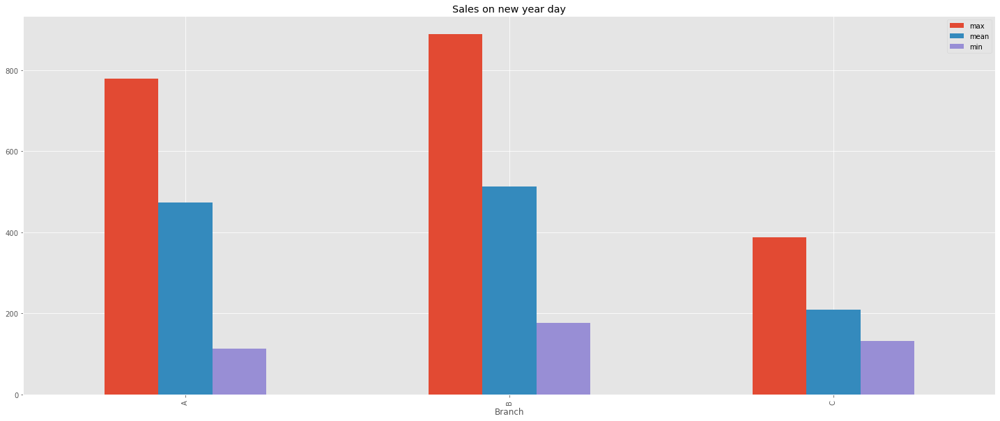

In [75]:
sales[ str(list(filter(lambda operation_date: str(operation_date).split(' ')[0] == "2019-01-01", business_dates) )[0] ).split(" ")[0] ].groupby('Branch')['Total'].agg(['max', 'mean','min']).plot(kind='bar')
plt.title("Sales on new year day")
plt.grid(True)

### Average money spend in a single transaction 
- People spend in avearge about $322.97 

In [76]:
round( sales.describe()['Total'].to_dict().get('mean'), 4 )

322.9667

### Sales Members vs Non-Members

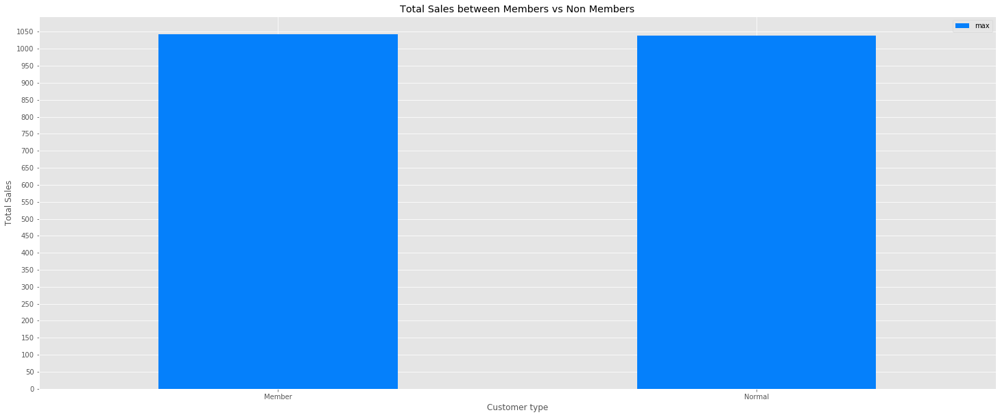

In [77]:
sales['Customer type'].map({'Member': 'Member', 'Normal': 'Non-Member'})
sales.groupby('Customer type').agg(['max'])['Total'].plot(kind='bar',colormap=ListedColormap(["#0580FB"]), rot=0)
plt.yticks(range(0,1100, 50))
plt.title("Total Sales between Members vs Non Members")
plt.ylabel("Total Sales")
plt.grid(True)

### Branch avearge profit each months 

In [78]:
pd.DataFrame( sales.groupby('Branch')['Total'].resample('M').mean() )

Total
Branch Date                  
A      2019-01-31  325.051500
       2019-02-28  317.660856
       2019-03-31  296.528516
B      2019-01-31  334.919446
       2019-02-28  315.819000
       2019-03-31  308.904844
C      2019-01-31  331.431811
       2019-02-28  329.349825
       2019-03-31  350.934368

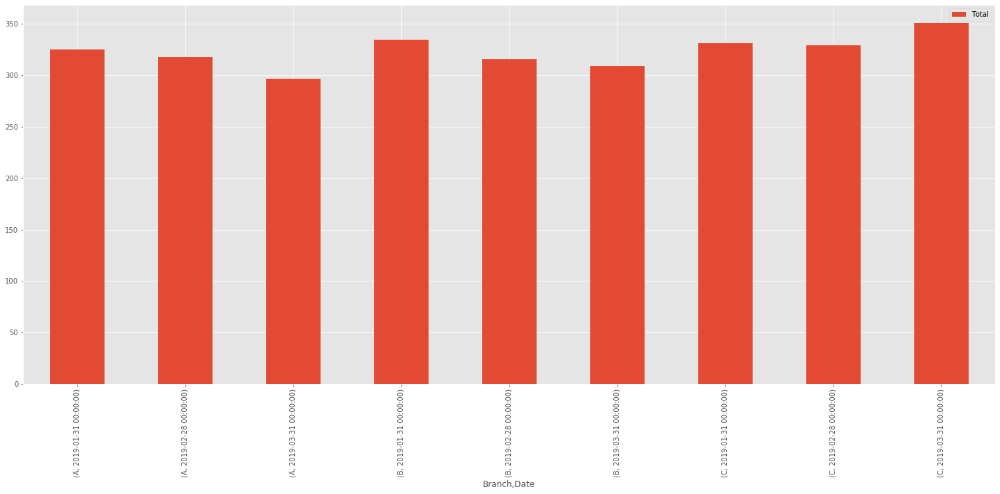

In [79]:
pd.DataFrame( sales.groupby('Branch')['Total'].resample('M').mean() ).plot(kind='bar') # .plot(kind='bar')  #.hist(by='Total',sharey=True) 


### Branch with the most customer but lower profit 


In [80]:
sales.groupby('Branch').agg(['min','count'])['Total']

,min,count
Branch,,
A,12.6945,340
B,18.6375,332
C,10.6785,328


Text(0.5, 1.0, 'Branch with the most customer but lower profit ')

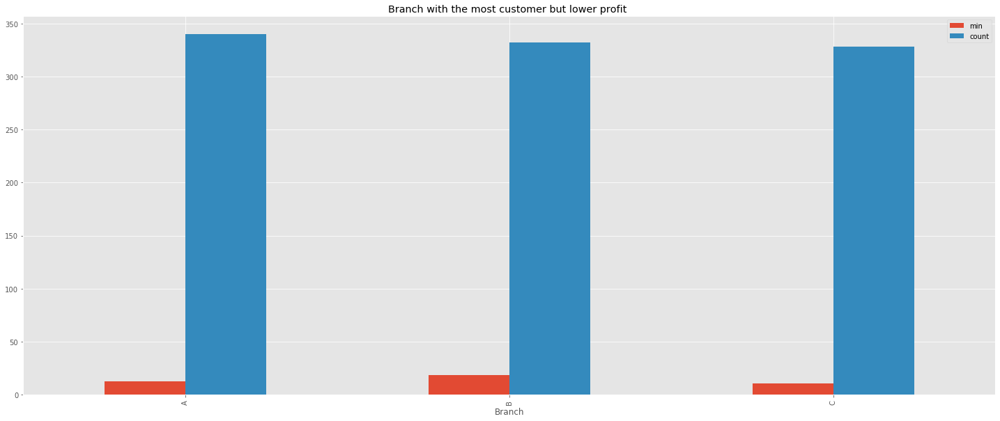

In [81]:
sales.groupby('Branch').agg(['min','count'])['Total'].plot(kind='bar')
plt.grid(True)
plt.title("Branch with the most customer but lower profit ")

### Product lines sales in January 

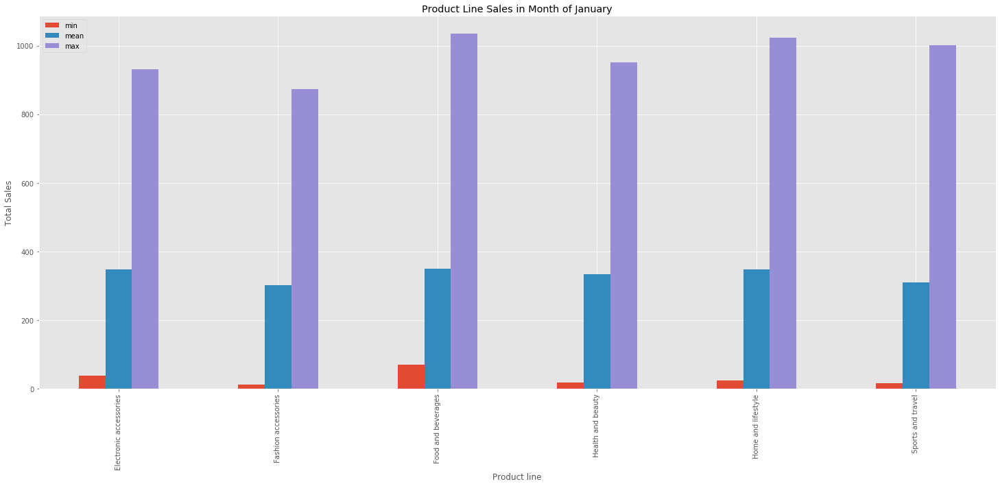

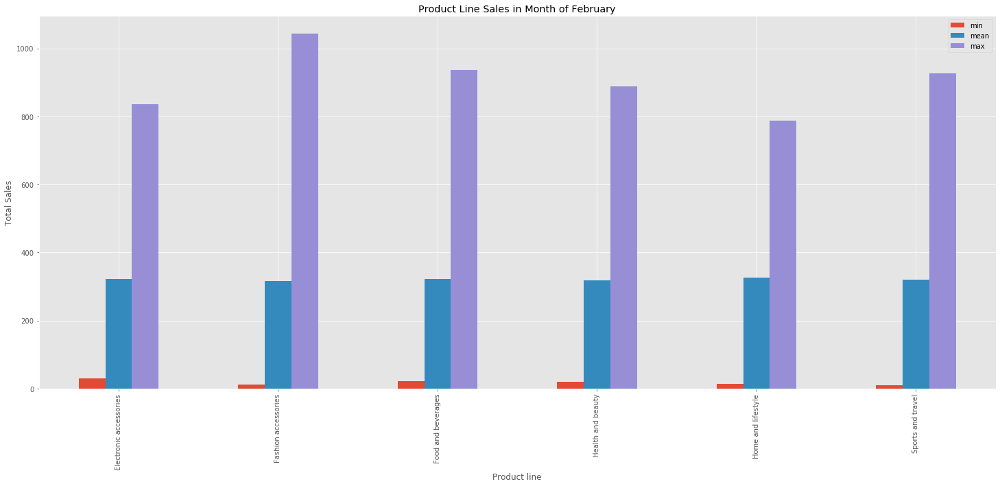

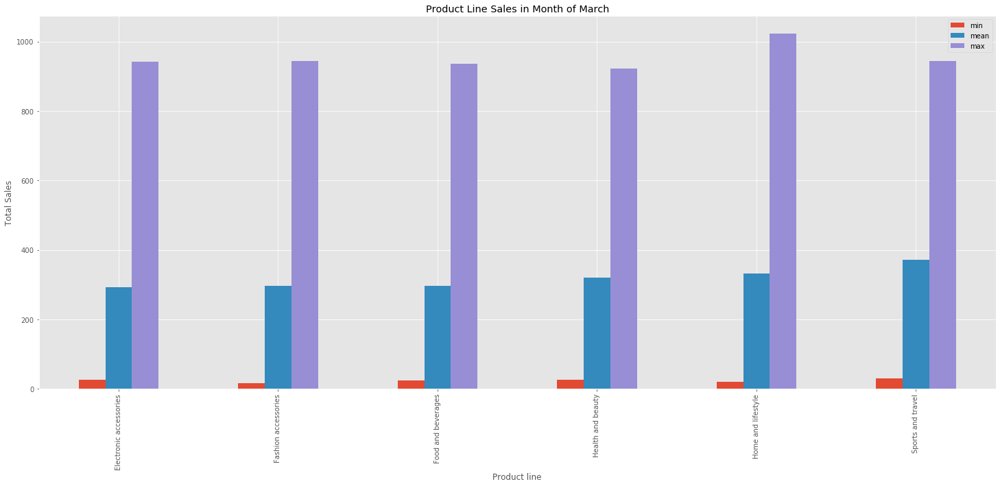

In [82]:
for index,month in enumerate(range(1,4)):
    sales[f'2019-0{month}'].groupby('Product line')['Total'].agg(['min','mean', 'max']).plot(kind='bar')
    map_months: List[str] = list( map(lambda month: 'January' if month == 1  else 'February' if month == 2 else 'March', range(1,4)) )
    plt.title(f"Product Line Sales in Month of {map_months[index]}")
    plt.ylabel("Total Sales")